# Methods for Data Science Coursework 1

## 0. Introduction

Let us first store the functions that will be used throughout the coursework:

1) `MSE` to compute the mean squared error (MSE) by inputting the actual response variable (y) and the predicted response variable (y_pred)

2) `cross_val_split` to split our training data into a number of folds for cross validation by inputting our data (data) and the number of folds we want (num_folds)

3) `r2_score` to compute the coefficient of determination of the model by inputting the actual response variable from test set (y_test) and the predicted response variable (y_pred)

4) `standardize` to standardize a matrix X

In [1]:
def MSE (y, y_pred):
    MSE= np.mean((y - y_pred)**2)
    return MSE

In [2]:
def cross_val_split(data, num_folds):
  fold_size = int(len(data) / num_folds)
  np.random.seed(777) # setting seed so that our folds are the same for comparison purposes
  data_perm = np.random.permutation(data) # take random permutation of data
  folds = []
  for k in range(num_folds):
    folds.append(data_perm[k*fold_size:(k+1)*fold_size, :])
  return folds

In [3]:
def r2_score(y_test, y_pred):
  numerator = np.sum((y_test - y_pred)**2) 
  y_avg = np.mean(y_test) 
  denominator = np.sum((y_test - y_avg)**2) 
  return 1 - numerator/denominator 

In [4]:
def standardize(X):
  mu = np.mean(X, 0) # compute the mean of X, namely X bar
  sigma = np.std(X, 0) # compute the stardard deviation of X
  X_std = (X - mu) / sigma # standardize
  return X_std , mu, sigma

# TASK 1: REGRESSION

## 1.0 Preliminaries

As an introduction to this regression task, we will first of all standardize our data that we will be using throughout the exercise, then we will be splitting our train and test set into the descriptors (design matrix) and the response variable y.

#### Standardization of descriptors
This is a key step in processing our data. Indeed, the descriptors don't necessarily have the same scale which can lead to large discrepencies in terms of contribution to the model and hence to its accuracy. For example, if one of the independant variables has a higher scale than the other variables, the model will be lead by the latter, and the influence of the other descriptors will be overlooked.

#### Splitting
Now we are splitting our train set and test sets as follows:

Train set: (data on which we operate all kinds of optimisation methods)
- ts_X: descriptors
- ts_y: response variable

Validation set: (note that the validation set data shall only be used for accuracy comparison and never any optimisation will be pursued on it)
- vs_X: descriptors
- vs_y: response variable

This is necessary for the 3 methods that we will be implementing: linear regression, ridge regression and kNN.

In [5]:
# import necessary tools to prepare and explore the data 
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

In [6]:
# load data from csv file
boston_train = pd.read_csv('regression_train(1).csv', header=None)
boston_test = pd.read_csv('regression_test(1).csv', header=None)

In [7]:
# standardize predictors of boston_train, standardize predictors of boston_set with the mu and sigma from boston_train (from col 1 to 17)
for i in range(1,18):
    boston_train[i] = (boston_train[i]-boston_train[i].mean())/boston_train[i].std()
    boston_test[i] = (boston_test[i]-boston_train[i].mean())/boston_train[i].std()

In [8]:
# view data: 1st column is the intercept, last column is the response variable
boston_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,1.0,-0.392094,-0.511057,0.166090,0.166087,0.199399,0.927081,0.848496,-0.790575,0.927281,-0.770569,1.196795,0.434895,-0.944051,0.199399,1.196800,-0.511058,-0.790491,23.9
1,1.0,-0.391458,-0.511057,-0.979931,-0.979939,-0.351273,0.762377,0.260728,-0.441619,0.762295,-0.632340,-0.789409,0.370024,-0.763551,-0.351273,-0.789418,-0.511058,-0.441719,29.9
2,1.0,-0.367516,-0.511057,-0.159682,-0.159668,0.304289,-0.563773,-0.865236,-0.690620,-0.564156,-0.061394,0.384257,0.434895,0.177019,0.304289,0.384263,-0.511062,-0.690623,24.5
3,1.0,-0.328877,-0.511057,-0.667247,-0.667248,-0.377496,0.789355,0.377574,-0.275121,0.789286,-0.566230,-0.428281,0.359884,-0.339096,-0.377496,-0.428265,-0.511057,-0.275054,27.5
4,1.0,-0.312092,-0.511057,-0.385105,-0.385096,-0.106530,0.244128,0.968882,0.276732,0.244231,-0.566230,1.196795,0.331655,0.065617,-0.106530,1.196791,-0.511059,0.276696,18.4


In [9]:
# make numpy array from pandas dataframe
boston_train = boston_train.to_numpy()
boston_test = boston_test.to_numpy()

In [10]:
# define training set 
ts_X = np.delete(boston_train,18,1) # predictors
ts_y = boston_train[:,18] # response variable

# define validation set
vs_X = np.delete(boston_test,18,1) # predictors
vs_y = boston_test[:,18] # response variable

Text(0, 0.5, '$y$')

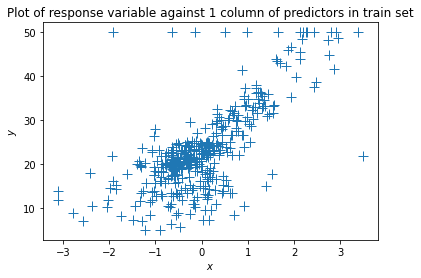

In [11]:
# plot 1 column of the predictor of the training set against the response variable
plt.figure()
plt.title('Plot of response variable against 1 column of predictors in train set')
plt.plot(ts_X[:,9], ts_y, '+', markersize=10)
plt.xlabel("$x$")
plt.ylabel("$y$")

### Interpretation of response variable against 1 predictor

This plot indicates that fitting a linear model might be a good first approach to estimate predictions. However note that this is the plot of only one predictor against the response variable.

What one could do is look at the correlation matrix of the predictors, as follows. It is useful to find relationship between predictors and look at the distribution of each predictors.

In [12]:
X_y = np.delete(ts_X,0,1) # delete intercept from predictors
X_y = pd.DataFrame(X_y) # make dataframe
X_y.head() #preview 

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-0.392094,-0.511057,0.166090,0.166087,0.199399,0.927081,0.848496,-0.790575,0.927281,-0.770569,1.196795,0.434895,-0.944051,0.199399,1.196800,-0.511058,-0.790491
1,-0.391458,-0.511057,-0.979931,-0.979939,-0.351273,0.762377,0.260728,-0.441619,0.762295,-0.632340,-0.789409,0.370024,-0.763551,-0.351273,-0.789418,-0.511058,-0.441719
2,-0.367516,-0.511057,-0.159682,-0.159668,0.304289,-0.563773,-0.865236,-0.690620,-0.564156,-0.061394,0.384257,0.434895,0.177019,0.304289,0.384263,-0.511062,-0.690623
3,-0.328877,-0.511057,-0.667247,-0.667248,-0.377496,0.789355,0.377574,-0.275121,0.789286,-0.566230,-0.428281,0.359884,-0.339096,-0.377496,-0.428265,-0.511057,-0.275054
4,-0.312092,-0.511057,-0.385105,-0.385096,-0.106530,0.244128,0.968882,0.276732,0.244231,-0.566230,1.196795,0.331655,0.065617,-0.106530,1.196791,-0.511059,0.276696


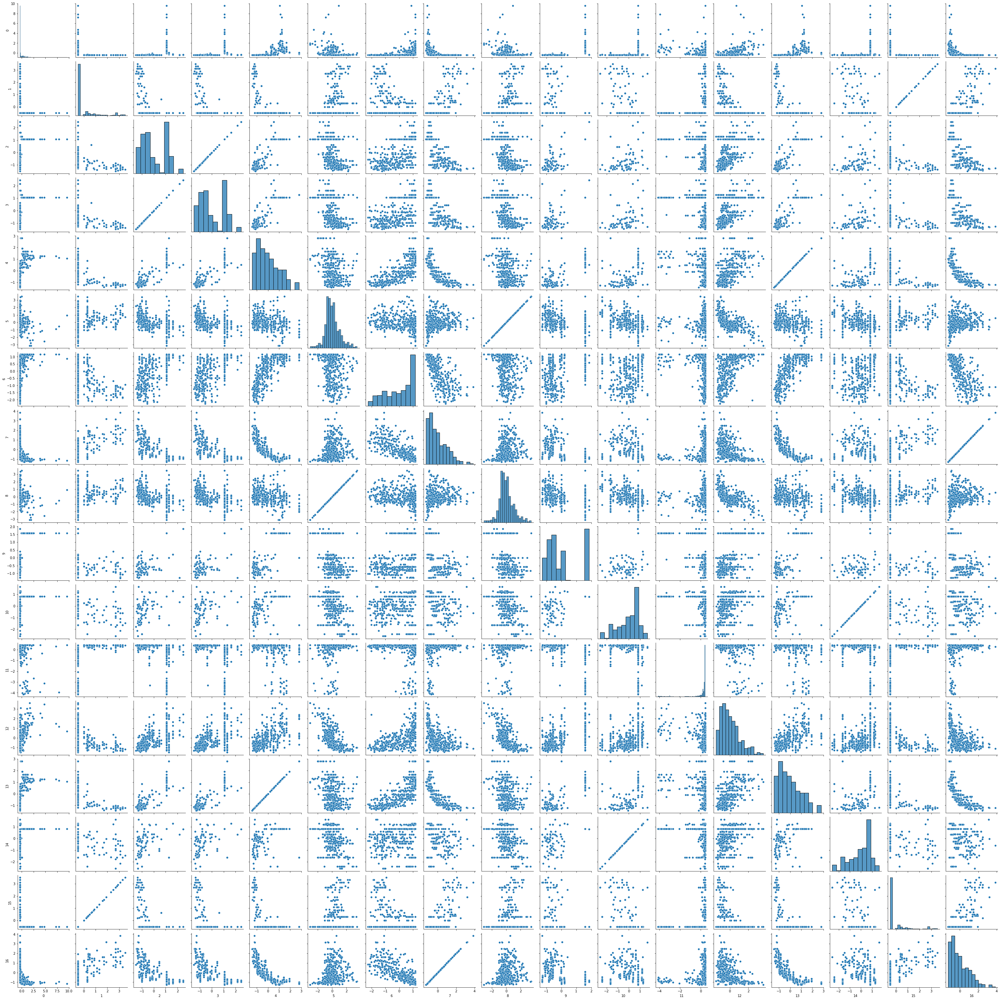

In [13]:
import seaborn as sns # import necessary package for pairplot, source 3
sns.pairplot(X_y) 

### Interpretation of pairplot

The diagonal entries of this matrix allow us to see the distribution of a single predictor via the plot of its histogram. The scatter plots on the upper and lower diagonal entries allow us to see the relationship or not of 2 variables. For example, predictor 16 and predictor 7 are linearly correlated, whilst predictor 14 and predictor 8 seem to have no relationship whatsover. (3)

## 1.1 LINEAR REGRESSION

### 1.1.1

In this first task, we obtain a linear regression to predict the median value of owner-occupied homes in USD 1000s as a response variable Y and the other features as predictors part of the design matrix X. We also display the mean squared error (MSE) from the training set.

In this exercise we are solving the following equation for beta:
$$
\underset{\boldsymbol\beta}{\text{min}} \| \mathcal Y - \mathcal X \boldsymbol\beta \|^2 = \underset{\boldsymbol\beta}{\text{min}} \ \text{L}_{\text{LS}} (\boldsymbol\beta)
$$
where $\text{L}_{\text{LS}}$ is the (ordinary) least squares loss function.

First, let us define the necessary functions for this task:

1) `max_lik_estimate`, which computes the maximum likelihood estimator (MLE) and is solution to the above equation 
$$
\beta_{\text{ML}} = (X^TX)^{-1}X^Ty
$$
where X is the design matrix, and y the response variable, by lecture notes.

2) `predict_with_estimate`, which computes the predicted y's for our estimated beta:
$$
y_{\text{pred}} = X.\beta_{\text{ML}}
$$

In [14]:
def max_lik_estimate(X, y):
    N, D = X.shape
    beta_ml = np.linalg.solve(X.T @ X, X.T @ y)
    return beta_ml

In [15]:
def predict_with_estimate(X_test, beta):
    prediction = np.dot(X_test,beta)
    return prediction 

Now, let us compute the said beta for our training dataset, and report the parameters of our model, namely the intercept and the linear regression slope.

In [16]:
# compute parameters of the model
beta_ml = max_lik_estimate(ts_X,ts_y)
intercept = beta_ml[0]
linear_regression_slope = beta_ml[1:18]

# output the results
print('The beta paramaters are:', beta_ml)
print('The linear regression intercept is:', intercept)
print('The linear regression slope is:', linear_regression_slope)

The beta paramaters are: [ 2.30185644e+01 -6.40572639e-01 -4.79505011e+04 -4.01670439e+04
  4.01668846e+04  2.25663438e+04  9.85996397e+02 -1.59001662e-01
  1.40510264e+03 -9.82870611e+02 -5.40457730e-02 -5.81266759e+03
  7.06058469e-01 -3.69589182e+00 -2.25681153e+04  5.81088199e+03
  4.79517064e+04 -1.40865780e+03]
The linear regression intercept is: 23.018564356435004
The linear regression slope is: [-6.40572639e-01 -4.79505011e+04 -4.01670439e+04  4.01668846e+04
  2.25663438e+04  9.85996397e+02 -1.59001662e-01  1.40510264e+03
 -9.82870611e+02 -5.40457730e-02 -5.81266759e+03  7.06058469e-01
 -3.69589182e+00 -2.25681153e+04  5.81088199e+03  4.79517064e+04
 -1.40865780e+03]


Now, let us compute the prediction for our model on our train dataset: y_pred_train and its in sample MSE:

In [17]:
# model prediction y_pred and preview
y_pred_train = predict_with_estimate(ts_X, beta_ml)
print('The predicted target variable is:', pd.Series(y_pred_train))

# in sample MSE
MSE_is = MSE(ts_y, y_pred_train)
print('In sample MSE:', MSE_is)

The predicted target variable is: 0      29.102266
1      31.658501
2      22.688848
3      29.142151
4      20.550541
         ...    
399    19.796838
400    28.232031
401    23.271431
402    37.237962
403    10.862293
Length: 404, dtype: float64
In sample MSE: 24.369246787889836


Now let us look at the residuals plot for the train data which analyzes the variance of the error of the regressor. We can see that our points are roughly randomly spread around the horizontal axis which means that using a linear regression model is appropriate and is performing quite well.

Text(0, 0.5, '$residuals$')

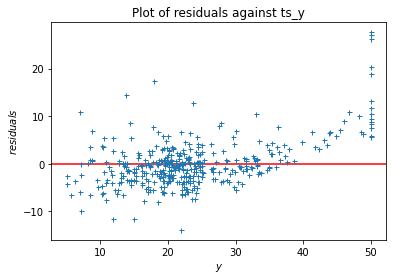

In [18]:
# plot of residuals for residuals against the response variable y in training set
e = ts_y - y_pred_train
plt.title('Plot of residuals against ts_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(ts_y, e, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$")

This plot of residuals shows some kind of behaviour around y=0, which is not exactly uniform, as there is a significant amount of data points not centered around zero for high values of y. We might wonder whether we could use a different method to estimate y.

### 1.1.2

Now, we use the model we have computed in 1.1.1 and we use it on our test data to predit the target variable y_pred_test and compute its out-of-sample MSE on the test set.

In [19]:
# predict the function values at the test points using the maximum likelihood estimator and preview the estimate
y_pred_test = predict_with_estimate(vs_X, beta_ml)
print('The predicted target variable is:', pd.DataFrame(y_pred_test))

# out of sample MSE
MSE_os = MSE(vs_y, y_pred_test)
print('Out of sample MSE:', MSE_os)

The predicted target variable is:              0
0    21.308706
1    31.988738
2    26.711024
3    24.238725
4    16.261076
..         ...
97   17.747281
98   17.211630
99   31.964318
100  23.083276
101   6.060318

[102 rows x 1 columns]
Out of sample MSE: 19.84345174272929


Similarly as 1.1.1, this plot of residuals shows good fit of our model against validation set data.

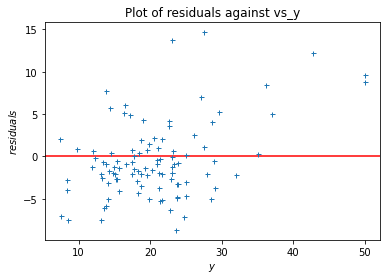

In [20]:
#plot of residuals for residuals against the response variable y in validation set
e_vs = vs_y - y_pred_test
plt.title('Plot of residuals against vs_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(vs_y, e_vs, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$");

This plot of residuals shows some kind of behaviour around y=0, which is not exactly uniform. We might wonder whether we could use a different method to estimate y.

### Comparison of the out-of-sample and the in-of-sample MSE

We get a MSE of 24.36 for in of sample and 19.84 for out of sample. This means that our test set fits the data better than our training set. This seems a bit odd so we might wonder why that is the case. Maybe the data hasn't been split properly or isn't clean or maybe the standard least squares isn't the best method to apply here. Indeed the residuals show show significant outliers for large values of y which might indicate that a non linear method might be more appropriate. Regardless the difference between these two MSE is quite low which is a good indicator that our model isn't overfitting.

## 1.2 RIDGE REGRESSION

## 1.2.1

In this task, we are using a 5-fold cross validation algorithm to tune our ridge model with the penalty parameter.

Essentially, we want to solve this equation for beta:
$$
\underset{\boldsymbol\beta}{\text{min}} \| \mathcal Y - \mathcal X \boldsymbol\beta \|^2 + \lambda \| \boldsymbol\beta \|^2 = \underset{\boldsymbol\beta}{\text{min}} \ \text{L}_{\text{ridge}} (\boldsymbol\beta)
$$
where $\text{L}_{\text{ridge}}$ is the ridge loss function.

This time, we have a parameter: lambda or the penalty, that we will be tuning using 5-fold cross validation.

Let us first of all define the necessary function to implement this task:

1) `ridge_estimate` is a function which computes the ridge beta (solution of the above equation) as follows:

$$
\boldsymbol\beta_{\text{ridge}} = (\boldsymbol X^T\boldsymbol X + \lambda I)^{-1}\boldsymbol X^T\boldsymbol y \, .
$$

where X is the design matrix, lambda the penalty parameter always positive, I the identity matrix and y the response variable.

2) `cross_val_evaluate_r` is a function which evaluates the in-sample and out-of-sample MSE in our data for the 5-fold cross validation

In [21]:
def ridge_estimate(X, y, penalty):
    N, D = X.shape
    I = np.identity(D)
    beta_ridge = np.linalg.solve(X.T @ X + penalty * I, X.T @ y)
    return beta_ridge

In [22]:
def cross_val_evaluate_r(data, folds, penalty):
    
    folds = cross_val_split(data, 5)

    val_scores_r = []
    train_scores_r = []

    for i in range(len(folds)):
        
    # define the training set
        train_set = np.delete(np.asarray(folds).reshape(len(folds), folds[0].shape[0], folds[0].shape[1]), i, axis=0)
        train_folds = train_set.reshape(len(train_set)*train_set[0].shape[0], train_set[0].shape[1])
        X_train = train_folds[:,:-1]
        y_train = train_folds[:, -1]
    
    # define the validation set
        val_fold = folds[i]
        X_val = val_fold[:,:-1]
        y_val = val_fold[:,-1]
 
    # train the model - ridge regression
        beta_ridge = ridge_estimate(X_train, y_train, penalty)
        y_pred_r_train = predict_with_estimate(X_train, beta_ridge)
        y_pred_r_val  = predict_with_estimate(X_val, beta_ridge)

    # evaluate
        train_score_r = MSE(y_train, y_pred_r_train)
        train_scores_r.append(train_score_r)
        val_score_r = MSE(y_val, y_pred_r_val)
        val_scores_r.append(val_score_r)

    return train_scores_r, val_scores_r

In [23]:
# tune penalty parameter: lambda
lambda_p = np.linspace(0,30,100) # look for lambda between 0 and 30
train_r = [] # initialize matrix of training MSE
train_r1 = []
train_r2 = []
train_r3 = []
train_r4 = []
train_r5 = []
val_r = [] # initialize matrix of validation MSE
val_r1 = []
val_r2 = []
val_r3 = []
val_r4 = []
val_r5 = []
for i in range(len(lambda_p)): # loop over the length of our penalty
    train_scores_r, val_scores_r = cross_val_evaluate_r(boston_train, 5, lambda_p[i])
    train_r1.append(train_scores_r[0])
    train_r2.append(train_scores_r[1])
    train_r3.append(train_scores_r[2])
    train_r4.append(train_scores_r[3])
    train_r5.append(train_scores_r[4])
    val_r1.append(val_scores_r[0])
    val_r2.append(val_scores_r[1])
    val_r3.append(val_scores_r[2])
    val_r4.append(val_scores_r[3])
    val_r5.append(val_scores_r[4])

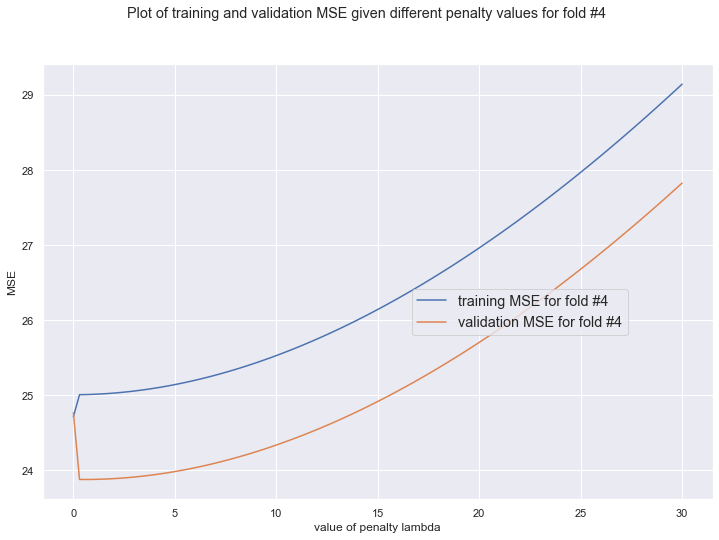

In [24]:
# plot of training and validation MSE for 1 fold, say fold #4
import seaborn as sns
sns.set()

fig, ax = plt.subplots(figsize = (12,8))

ax.plot(lambda_p,train_r4, label='training MSE for fold #4')
ax.plot(lambda_p,val_r4, label='validation MSE for fold #4')

plt.xlabel('value of penalty lambda')
plt.ylabel('MSE')

plt.suptitle('Plot of training and validation MSE given different penalty values for fold #4')

fig.legend(loc='right', fontsize='large', bbox_to_anchor=(0.81,0.45), frameon=True)

plt.show()

### Interpretation of plot of training and validation MSE for fold #4 against values of lambda penalty

We can see on this plot of training and validation MSE for fold #4 that there clearly is a value of penalty lambda corresponding to the minimum of the validation MSE. In the next cell we will be computing this minimal penalty value for all the folds.

In [25]:
# find the best penalty value for each fold, corresponding to the minimal MSE
val_r = [val_r1, val_r2, val_r3, val_r4, val_r5] # stack results together
for i in range(5): # loop over the number of folds
    j = np.argmin(val_r[i])
    print("Best penalty value for fold #{}: {}".format(i+1, lambda_p[j]))

Best penalty value for fold #1: 0.30303030303030304
Best penalty value for fold #2: 4.545454545454546
Best penalty value for fold #3: 6.363636363636364
Best penalty value for fold #4: 0.6060606060606061
Best penalty value for fold #5: 2.7272727272727275


In [26]:
# compute the optimal lambda penalty 
MSE_r_mean = np.sum(val_r, axis=0)/5 # take the mean of the MSE
j = np.argmin(MSE_r_mean)
optimal_lambda_p = lambda_p[j]
print("Optimal penalty value: {}".format(optimal_lambda_p))

Optimal penalty value: 3.0303030303030303


Hence we get that the optimal penalty value is 3 after having tuned our penalty over the 5 folds and performed cross-validation.

## 1.2.2

Here we want to compute the average in-sample and out-of-sample MSE over the 5 folds and compare to standard linear regression.

In [27]:
# estimator of model
beta_r = ridge_estimate(ts_X, ts_y, optimal_lambda_p)

# compute the predicted response variable from training set and test set
y_pred_train_r = predict_with_estimate(ts_X, beta_r)
print('The predicted response variable from the training set is:', pd.DataFrame(y_pred_train_r))

y_pred_test_r = predict_with_estimate(vs_X, beta_r)
print('The predicted response variable from the test set is:', pd.DataFrame(y_pred_test_r))

The predicted response variable from the training set is:              0
0    29.355363
1    31.676000
2    21.788198
3    28.922232
4    20.296085
..         ...
399  19.741834
400  27.737833
401  22.522898
402  37.496351
403  11.099212

[404 rows x 1 columns]
The predicted response variable from the test set is:              0
0    21.245784
1    32.219307
2    26.233422
3    23.880450
4    15.859663
..         ...
97   16.991809
98   17.310997
99   31.316307
100  22.600116
101   5.487721

[102 rows x 1 columns]


In [28]:
# in sample MSE
MSE_ris = MSE(ts_y, y_pred_train_r)
print('In of sample MSE:', MSE_ris)

# out of sample MSE
MSE_ros = MSE(vs_y, y_pred_test_r)
print('Out of sample MSE:', MSE_ros)

In of sample MSE: 24.58599286907195
Out of sample MSE: 19.506366781104028


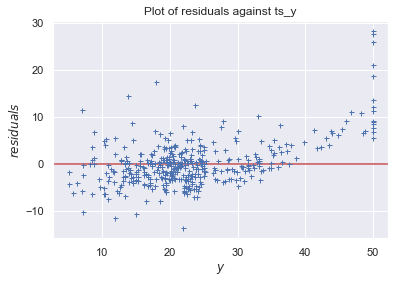

In [29]:
#plot of residuals for ridge residuals against the response variable y in training set
e_ts_r = ts_y - y_pred_train_r
plt.title('Plot of residuals against ts_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(ts_y, e_ts_r, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$");

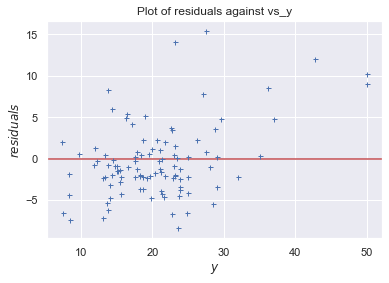

In [30]:
#plot of residuals for ridge residuals against the response variable y in validation set
e_vs_r = vs_y - y_pred_test_r
plt.title('Plot of residuals against vs_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(vs_y, e_vs_r, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$");

### Interpretation of residual plots

These 2 residual plots for training and test set residuals are very similar to the ones from standard linear regression. Actually this is not so surprising seeing as our predicted response variable are extremely similar too.

### Comparison of the out-of-sample and the in-of-sample MSE

We get a MSE of 24.58 for in of sample and 19.50 for out of sample. This is very close to what we get in standard linear regression. It seems that our test set fits the data better than our training set. This seems a bit odd so we might wonder why that is the case. Maybe the data hasn't been split properly or isn't clean or maybe a other regression methods could be applied, like non linear methods, seeing as the residuals are not exactly uniformly distributed around y=0. Regardless the difference between these two MSE is quite low which is a good indicator that our model isn't overfitting. 
Additionnaly, the out-of-sample MSE for ridge regression is slightly lower than for the standard linear regression, which is a result that makes sense as we would expect ridge regression to be better fitting than standard linear regression because of this penalty parameter that we have tuned.

### Differences between the two methods in terms of particular predictors of interest

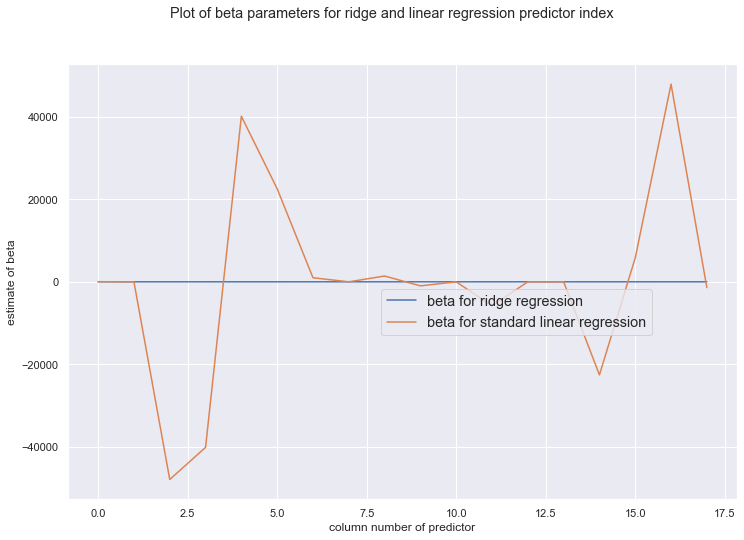

In [31]:
import seaborn as sns
sns.set()

fig, ax = plt.subplots(figsize = (12,8))
y_p = np.linspace(0,17,18)
ax.plot(y_p, beta_r, label='beta for ridge regression')
ax.plot(y_p, beta_ml, label='beta for standard linear regression')

plt.xlabel('column number of predictor')
plt.ylabel('estimate of beta')

plt.suptitle('Plot of beta parameters for ridge and linear regression predictor index')

fig.legend(loc='right', fontsize='large', bbox_to_anchor=(0.81,0.45), frameon=True)

plt.show()

### Interpretation of plot of betas 

The main goal of ridge regression is to shrink the betas which makes them more stable, as we can see in the plot above, the blue line (flat) represents the consistency of beta parameters for all the predictors. Whereas in standard linear regression, we can see a large discrepency in values of beta especially for column 2, 4, 14 and 16. This can explain the slight difference in MSE obtained between the two models, as ridge has an out of sample MSE slightly lower than standard linear regression. 

## 1.3 REGRESSION WITH K NEAREST NEIGHBOURS (KNN)

In this task, we are implementing the kNN algorithm as a regression model. Note that this is a non linear regression method. 

We compare its performance to the other regression models we implemented.
kNN algorithm has input the k closest training data points in the dataset and it outputs the property value of the object which is the average of the values of the k nearest neighbours. So we want to tune that k to get the lowest MSE.

In [32]:
# import necessary package to plot train and test data
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

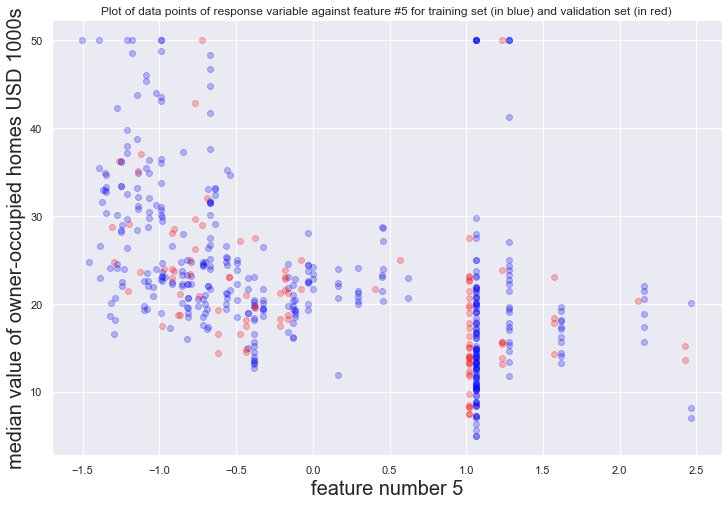

In [33]:
# define colormaps
cm = plt.cm.RdBu
cm_bright = ListedColormap(['blue', 'red', 'green'])

# visual exploration of data
plt.figure(figsize=(12,8))
plt.xlabel(r"feature number 5", size=20)
plt.ylabel(r"median value of owner-occupied homes USD 1000s", size=20)
plt.scatter(ts_X[:,4], ts_y, c='blue', alpha=0.25)
plt.scatter(vs_X[:,4], vs_y, c='red', alpha=0.25)
plt.title('Plot of data points of response variable against feature #5 for training set (in blue) and validation set (in red)')
plt.show()

### Interpretation of data exploration

This plot of the data points of response variable y against one of the features allows us to visually see what we are going to do for kNN, which is computing distances between training set data points and test set data points essentialy. Once again, red points are for test data and blue points are for train data.

## 1.3.1

Let us first of all define the necessary function to implement this task:

1) `euclidian_distance` is a function which computes the euclidian distance between data points as follows:

$$
d(\boldsymbol p, \boldsymbol q) = \sqrt{\sum_{i=1}^D{(q_i-p_i)^2}} \, ,
$$

2) `k_neighbours` is a function which finds the k nearest neighbours in our train set for every test data point

3) `reg_predict` is a function which computes the y_pred for our model

4) `cross_val_evaluate_knn` is a function which computes the MSE over the 5 cross validation folds for cross validation train and test data

In [34]:
# euclidean distance
def euclidian_distance(p, q):
    return np.sqrt(np.sum((p-q)**2, axis=1))

In [35]:
# kNN algo
def k_neighbours(X_test, X_train, k, return_distance=False):
  n_neighbours = k
  dist = []
  neigh_ind = []
  
  # compute distance from each point x_text in X_test to all points in X_train
  point_dist = [euclidian_distance(x_test, X_train) for x_test in X_test]

  # determine which k training points are closest to each test point
  for row in point_dist:
      enum_neigh = enumerate(row)
      sorted_neigh = sorted(enum_neigh, key=lambda x: x[1])[:k]

      ind_list = [tup[0] for tup in sorted_neigh]
      dist_list = [tup[1] for tup in sorted_neigh]

      dist.append(dist_list)
      neigh_ind.append(ind_list)
  
  # return distances together with indices of k nearest neighbouts
  if return_distance:
      return np.array(dist), np.array(neigh_ind)
  
  return np.array(neigh_ind)

In [36]:
# computing y_pred for kNN
def reg_predict(X_train, X_test, y_train, k=20):
  # each of the k neighbours contributes equally to the classification of any data point in X_test  
  neighbours = k_neighbours(X_test, X_train, k=k)
  # compute mean over neighbours labels
  y_pred = np.array([np.mean(y_train[neighbour]) for neighbour in neighbours]) 
  return y_pred

In [37]:
def cross_val_evaluate_knn(data, folds, k):

    k = int(k) # number of neighbours

    folds = cross_val_split(data, 5)

    val_scoresk = []
    train_scoresk = []

    for i in range(len(folds)):
        
    # define the training set
        train_set = np.delete(np.asarray(folds).reshape(len(folds), folds[0].shape[0], folds[0].shape[1]), i, axis=0)
        train_folds = train_set.reshape(len(train_set)*train_set[0].shape[0], train_set[0].shape[1])
        X_train = train_folds[:,:-1]
        y_train = train_folds[:, -1]
    
    # define the validation set
        val_fold = folds[i]
        X_val = val_fold[:,:-1]
        y_val = val_fold[:,-1]
 
    # predicted response variable by our trained model 
        y_pred_knn_train = reg_predict(X_train, X_train, y_train, k) # train set of cross val
        y_pred_knn_test = reg_predict(X_train, X_val, y_train, k) # test set of cross val

    # evaluate the MSE at each fold for train and val set within cross validation
        train_score = MSE(y_train, y_pred_knn_train)
        train_scoresk.append(train_score)
        
        val_score = MSE(y_val, y_pred_knn_test)
        val_scoresk.append(val_score)

    return train_scoresk, val_scoresk

In the following cell, we are tuning our paramater k with respect to our 5 fols cross validation 

In [38]:
# tune our paramater k: number of neighbours 
k = np.linspace(1,100,100) # explore values of k between 1 and 100 neighbours
train_k = [] # initialize array for training set MSE for kNN
train_k1 = [] # MSE from training set fold 1
train_k2 = []
train_k3 = []
train_k4 = []
train_k5 = []
val_k = [] # initialize array for validation set MSE for kNN
val_k1 = [] # MSE from validation set fold 1
val_k2 = []
val_k3 = []
val_k4 = []
val_k5 = []
for i in range(len(k)): # loop over the number of neighbours we are trying out
    train_scoresk, val_scoresk = cross_val_evaluate_knn(boston_train, 5, int(k[i])) # compute MSE over each value of k
    train_k1.append(train_scoresk[0]) # update array with newest train set MSE
    train_k2.append(train_scoresk[1])
    train_k3.append(train_scoresk[2])
    train_k4.append(train_scoresk[3])
    train_k5.append(train_scoresk[4])
    val_k1.append(val_scoresk[0]) # update array with newest val set MSE
    val_k2.append(val_scoresk[1])
    val_k3.append(val_scoresk[2])
    val_k4.append(val_scoresk[3])
    val_k5.append(val_scoresk[4])

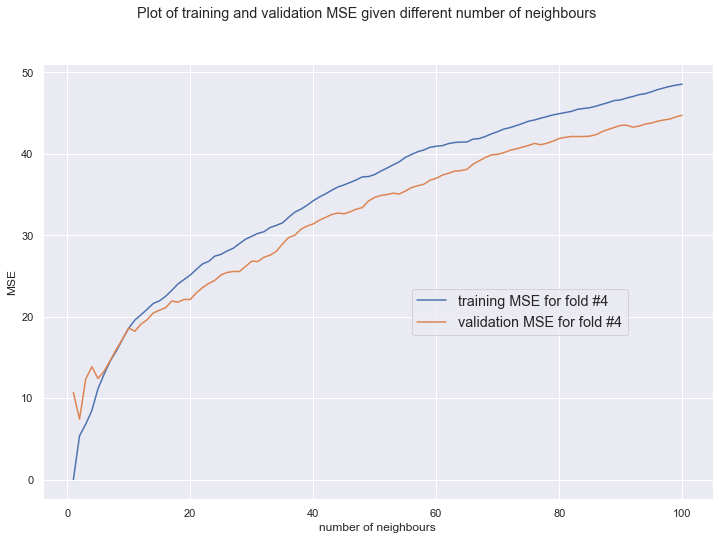

In [39]:
# plot of training and validation MSE for 1 fold
import seaborn as sns
sns.set()

fig, ax = plt.subplots(figsize = (12,8))

ax.plot(k,train_k4, label='training MSE for fold #4')
ax.plot(k,val_k4, label='validation MSE for fold #4')

plt.xlabel('number of neighbours')
plt.ylabel('MSE')

plt.suptitle('Plot of training and validation MSE given different number of neighbours')

fig.legend(loc='right', fontsize='large', bbox_to_anchor=(0.81,0.45), frameon=True)

plt.show()

### Interpretation of plot of training and validation set MSE for fold #4 against number of neighbours

We can see on this plot of training and validation MSE for fold #4 that there clearly is a number of neighbours corresponding to the minimum of the validation MSE. In the next cell we will be computing this number of neighbours for minimal MSE for all the folds.

In [40]:
# find the best number of neighbours for each fold
val_k = [val_k1, val_k2, val_k3, val_k4, val_k5] # make array of MSE over all 5 folds
for i in range(5): # loop over number of folds
    j = np.argmin(val_k[i]) # take the k from corresponding minimal MSE
    print("Best number of neighbours for fold #{}: {}".format(i+1, k[j]))

Best number of neighbours for fold #1: 2.0
Best number of neighbours for fold #2: 2.0
Best number of neighbours for fold #3: 3.0
Best number of neighbours for fold #4: 2.0
Best number of neighbours for fold #5: 3.0


For fold #4 as plotted above, the optimal value for k is 2, where is MSE is minimal for the validation set. Then by looking into val_k in the fourth row, we can see that the minimal corresponding MSE is 7.42.

In [41]:
# compute optimal number of neighbours overall
MSE_mk = np.sum(val_k, axis=0)/5 # mean of MSE over each column of k: from 5x100 to 1x100
j = np.argmin(MSE_mk) # pick entry that has lowest MSE
optimal_k = k[j]
print("Optimal # of k parameter: {}".format(optimal_k))

Optimal # of k parameter: 2.0


In [42]:
# compute predicted response variable from training and validation set
y_pred_knn_train = reg_predict(ts_X, ts_X, ts_y, 2) # optimal k=2
print('predicted y from training set is:', pd.DataFrame(y_pred_knn_train))

y_pred_knn_test = reg_predict(ts_X, vs_X, ts_y, 2) # optimal k=2
print('predicted y from validation set is:', pd.DataFrame(y_pred_knn_test))

predicted y from training set is:          0
0    22.95
1    28.70
2    23.15
3    27.10
4    16.45
..     ...
399  19.95
400  25.85
401  23.35
402  38.10
403  23.40

[404 rows x 1 columns]
predicted y from validation set is:          0
0    19.70
1    33.45
2    19.85
3    24.80
4     9.85
..     ...
97   14.85
98   14.35
99   30.60
100  19.40
101   8.70

[102 rows x 1 columns]


### Analysis of distribution of errors for best k over folds 3 and 4

Mean for k=2 is: 0    0.021569
dtype: float64
Std for k=2 is: 0    3.732189
dtype: float64


Text(0.5, 0, '$errors$')

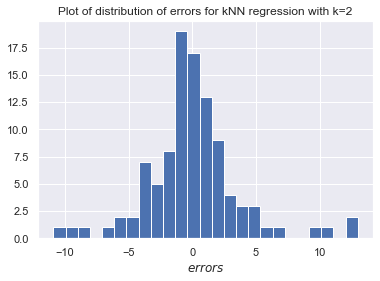

In [43]:
# for k = 2, corresponding to fold 4
y_knn2 = reg_predict(ts_X, vs_X, ts_y, 2) # computation of y predicted for k=2
x_knn = vs_y - y_knn2 # computation of error

x_knn_df = pd.DataFrame(x_knn) # make into dataframe to compute its mean and std more easily
print('Mean for k=2 is:', x_knn_df.mean()) # compute mean
print('Std for k=2 is:',  x_knn_df.std()) # compute Std

plt.title('Plot of distribution of errors for kNN regression with k=2')
plt.hist(x_knn, 25)
plt.xlabel("$errors$")

Mean for k=2 is: 0    0.095098
dtype: float64
Std for k=2 is: 0    3.521058
dtype: float64


Text(0.5, 0, '$errors$')

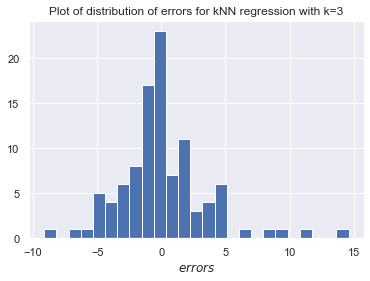

In [44]:
# for k = 3, corresponding to fold 3
y_knn3 = reg_predict(ts_X, vs_X, ts_y, 3) # computation of y predicted for k=3
x_knn3 = vs_y - y_knn3 # computation of error

x_knn3_df = pd.DataFrame(x_knn3)  # make into dataframe to compute its mean and std more easily
print('Mean for k=2 is:', x_knn3_df.mean()) # compute mean
print('Std for k=2 is:',  x_knn3_df.std()) # compute Std

plt.title('Plot of distribution of errors for kNN regression with k=3')
plt.hist(x_knn3, 25)
plt.xlabel("$errors$")

### Analysis of errors of kNN predicted response var

We can see that for the different best number of neighbours that we get out of our 5 fold cross validation (k=2 & k=3), our errors (response variable y from validation set - predicted response variable y) are distributed in a bell shape curve with mean of approximatively zero (0.09 & 0.02) which seems Gaussian with Std of 3.52 and 3.73. This could be the case because of the Central limit theorem.

## 1.3.2

In this task, we are computing the in sample and out of sample MSE over the 5 folds, and comparing to values from standard linear and ridge regression. We also compare the performance of the kNN algorithm to the 2 other models using the coefficient of determination, the distribution of errors and comparison of MSE.

In [45]:
# in sample MSE
MSE_knnis = MSE(ts_y, y_pred_knn_train)
print('In sample MSE', MSE_knnis)

# out of sample MSE
MSE_knnos = MSE(vs_y, y_pred_knn_test)
print('Out of sample MSE', MSE_knnos)

In sample MSE 3.970810643564356
Out of sample MSE 13.793137254901962


### Comparison of the out-of-sample and the in-of-sample MSE, and with other models

In kNN, we do not assume linearity of data. As the previous residual plots have shown us, there are points in higher values of y that make us think that the data is not uniformly distributed around 0 over the whole range of y. This makes us think that a linear model might not be the best idea to fit this data. Actually the MSE results we are getting for kNN confirm this hypothesis, as we are getting much much smaller values (for kNN 13 in val set vs 19 for ridge and linear in val set). A point to note however is that in-of-sample and out-of-sample are significantly different which could mean overfitting. 

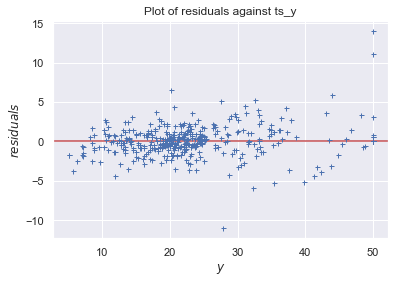

In [46]:
#plot of residuals for kNN residuals against the response variable y in training set
e_ts_knn = ts_y - y_pred_knn_train # compute residuals 
plt.title('Plot of residuals against ts_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(ts_y, e_ts_knn, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$");

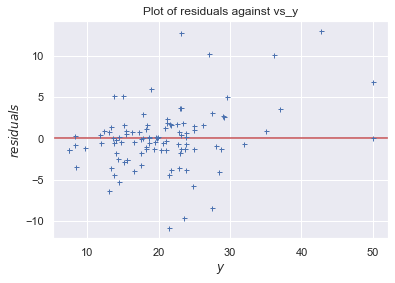

In [47]:
#plot of residuals for ridge residuals against the response variable y in validation set
e_vs_knn = vs_y - y_pred_knn_test
plt.title('Plot of residuals against vs_y')
plt.axhline(y=0, color='r', linestyle='-')
plt.plot(vs_y, e_vs_knn, '+', markersize=5)
plt.xlabel("$y$")
plt.ylabel("$residuals$");

### Interpretation of residual plots 

Clearly in the residual plots for kNN predictors, we can see that the residuals are more uniformly distributed around y=0 than the residuals for standard linear regression and ridge regression. This could be that a non linear model such as kNN is a better model for our data for example.

### Compute distribution of errors for standard linear regression and ridge regression

Mean for k=2 is: 0   -0.4245
dtype: float64
Std for k=2 is: 0    4.456224
dtype: float64


Text(0.5, 0, '$errors$')

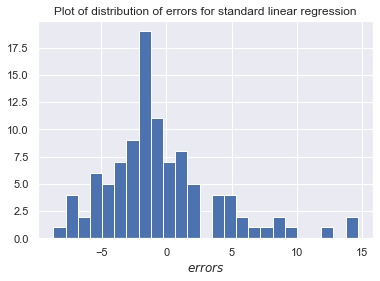

In [48]:
x_ls = vs_y - y_pred_test # computation of error for standard linear regression prediction

x_ls_df = pd.DataFrame(x_ls) # make into dataframe to compute its mean and std more easily
print('Mean for k=2 is:', x_ls_df.mean()) # compute mean
print('Std for k=2 is:',  x_ls_df.std()) # compute Std

plt.title('Plot of distribution of errors for standard linear regression')
plt.hist(x_ls, 25)
plt.xlabel("$errors$")

Mean for k=2 is: 0   -0.288277
dtype: float64
Std for k=2 is: 0    4.428947
dtype: float64


Text(0.5, 0, '$errors$')

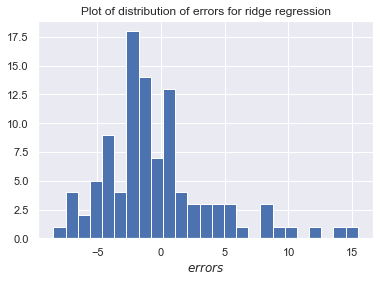

In [49]:
x_r1 = vs_y - y_pred_test_r # computation of error for ridge prediction

x_r1_df = pd.DataFrame(x_r1) # make into dataframe to compute its mean and std more easily
print('Mean for k=2 is:', x_r1_df.mean()) # compute mean
print('Std for k=2 is:',  x_r1_df.std()) # compute Std

plt.title('Plot of distribution of errors for ridge regression')
plt.hist(x_r1, 25)
plt.xlabel("$errors$")

This time, we can see that the errors for the predicted response variables done by standard linear regression and ridge regression are less smooth than the one predicted by kNN. Indeed, their mean is a bit off zero with higher standard deviation. We can explore why is that in the comparison of performance of models below. We can make as a hypothesis that our kNN model might be the better of the three.

### Compare performance of models

In [50]:
print(r'LS: R2 score for train set:', r2_score(ts_y, y_pred_train))
print(r'LS: R2 score for validation set:', r2_score(vs_y, y_pred_test))
print(r'Ridge: R2 score for train set:', r2_score(ts_y, y_pred_train_r))
print(r'Ridge: R2 score for validation set:', r2_score(vs_y, y_pred_test_r))
print(r'kNN: R2 score for train set:', r2_score(ts_y, y_pred_knn_train))
print(r'kNN: R2 score for validation set:', r2_score(vs_y, y_pred_knn_test))

LS: R2 score for train set: 0.7285833324178141
LS: R2 score for validation set: 0.6609719469088533
Ridge: R2 score for train set: 0.7261692857475173
Ridge: R2 score for validation set: 0.6667310890050862
kNN: R2 score for train set: 0.9557744151119315
kNN: R2 score for validation set: 0.7643423870919144


Computing the R squared or coefficient of determination is looking at the proportion of the variance in the dependent variable that is predictable from the independent variables. We can compare these values are we are not adding any descriptors to the 3 models tested, so it makes sures that R2 is comparable. Indeed if we were to add descriptors to one of the models, naturally R2 would increase and in that case we would need to look at the adjusted R2 tool.

In any case, we can see that kNN has the highest R2 score on its validation set which would be attractive. However, we know that its in sample MSE and out of sample MSE differ significantly which could mean overfitting. Also from our plots of residuals from the 3 models, the kNN seem more uniformly distributed, which could confirm the hypothesis that some of our descriptors are nonlinear (see pairplot in the beginning of this task), as kNN is a non linear method.

Regarding the homogeneity of the data, as stated by our analysis of the residuals which is not quite uniform, we could perhaps say that our data is not exactly homogeneous.

# TASK 2: CLASSIFICATION

## 2.1 LOGISTIC REGRESSION

In this task, we wish to implement a logistic regression classifier which is used to classify data points binarily using the logistic function:
$$
f(x) = \frac{1}{1+e^{-x}}
$$

## 2.1.0 Import data

First of all, let's import the data, define predictors and response variables and standardize.

In [51]:
# import necessary tools for logistic regression
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

In [52]:
# load dataset from csv file
bank_train = pd.read_csv('classification_train(1).csv', header=None)
bank_test = pd.read_csv('classification_test(1).csv', header=None)

In [53]:
# transform pandas dataframe into np arrays
bank_train = bank_train.to_numpy()
bank_test = bank_test.to_numpy()

In [54]:
# define training and test set 
X_train_b = (bank_train[:,:-1])
y_train_b = bank_train[:,-1]

X_test_b = (bank_test[:,:-1])
y_test_b = bank_test[:,-1]

# standardize predictors
X_train_b, mu, sigma = standardize(X_train_b)
X_test_b = (X_test_b - mu) / sigma

# standardized training set
bank_train_std = np.hstack((X_train_b,np.array([y_train_b]).T))

X_train_b = X_train_b.T # transpose for consistency purposes with the following functions
X_test_b = X_test_b.T

## 2.1.1

This exercise is based around solving the following equation:
$$
\hat{\boldsymbol y}_{\text{log}} = f(\boldsymbol \beta^T \boldsymbol X + \beta_0)
$$
where $\boldsymbol X = [X^{(1)}, X^{(2)}, \dots, X^{(n)}]$, and $X^{(i)} \in \mathbb R^d$
and f being the logistic function.

Now, let us define the major functions that we will be using for training our logistic regression classifier:

1) `logistic` is a function which computes the logistic function for a given x

2) `predict_log` is a function which computes the y from the equation above

3) `initialise` is a function our parameters beta and betazero randomly 

In [55]:
def logistic(x):
    return 1 / (1 + np.exp(-x))

In [56]:
def predict_log(X, beta, beta_0):
  y_log = logistic(beta.T @ X + beta_0)
  return y_log

In [57]:
def initialise(d):
  """
  Argument:
  d: size of the beta vector (or number of parameters)
  Returns:
  beta: initialised vector of shape (d, 1)
  beta_0: initialised scalar (corresponds to the offset)
  """
  beta = np.zeros(shape=(d, 1), dtype=np.float32)
  beta_0 = 0
  assert(beta.shape==(d, 1))
  assert(isinstance(beta_0, float) or isinstance(beta_0, int))
  return beta, beta_0

Next, we implement a forward pass, also called propagate which implements the cost function and its derivatives. We use the derivatives as part of a gradient descent to optimise the cost function.
Cost function:
$$
\mathcal L = - \frac{1}{n} \sum_{i=1}^n y^{(i)} \log(\hat{y}_{\text{log}}^{(i)}) + (1-y^{(i)}) \log (1-\hat{y}_{\text{log}}^{(i)}) \, .
$$
Partial derivatives:
$$
\frac{\partial \mathcal L}{\partial \boldsymbol \beta} = \frac{1}{n} \sum_{i=1}^n ( y^{(i)} - \hat{y}_{\text{log}}^{(i)}) X^{(i)}
$$
 
$$
\frac{\partial \mathcal L}{\partial \beta_0} = \frac{1}{n} \sum_{i=1}^n ( y^{(i)} - \hat{y}_{\text{log}}^{(i)})
$$

In [58]:
def propagate(X, y, beta, beta_0):
  n = X.shape[1]
  y_log = predict_log(X, beta, beta_0)

  # cost function
  cost = (-1) * np.mean(np.multiply(y, np.log(y_log)) + np.multiply(1-y, np.log(1 - y_log)), axis=1)

  # derivatives
  dbeta = (1/n) * X @ np.transpose(y_log - y)
  dbeta_0 = np.mean((y_log - y))

  assert(dbeta.shape==beta.shape)
  assert(dbeta_0.dtype==float)
  cost = np.squeeze(cost)
  assert(cost.shape==())

  # store gradients in a dictionary
  grads = {"dbeta": dbeta, "dbeta_0": dbeta_0}
  return grads, cost

Now, in the next cell, let us optimise the model with a defined learning rate which we will later tune, by calculating the parameters for our training sets.

In [59]:
def optimise(X, y, beta, beta_0, num_iterations=1000, learning_rate=0.005, print_cost=False):
    """
    Arguments:
    X: data of size (d, n)
    y: true label vector of size (1, n)
    beta: parameters, a numpy array of size (d, 1)
    beta_0: offset, a scalar
    num_iterations: number of iterations gradient descent shall update the parameters
    learning_rate: step size in updating procedure

    Returns:
    params: dictionary containing the parameters beta and offset beta_0
    grads: dictionary containing the gradients
    costs: list of all the costs computed during the optimisation (can be used to plot the learning curve).
    """
    costs = []
    for i in range(num_iterations):
        #calculate cost and gradients
        grads, cost = propagate(X, y, beta, beta_0)
        # retrieve derivatives from grads
        dbeta = grads["dbeta"]
        dbeta_0 = grads["dbeta_0"]
        # updating procedure
        beta = beta - learning_rate * dbeta
        beta_0 = beta_0 - learning_rate * dbeta_0
        # record the costs
        if i % 100 == 0:
            costs.append(cost)

    # save parameters and gradients in dictionary
    params = {"beta": beta, "beta_0": beta_0}
    grads = {"dbeta": dbeta, "dbeta_0": dbeta_0}
    return params, grads, costs

Now in the following cell, we can predict the labels (1 or 0) for our test set, and hence do the classification.

In [60]:
def predict(X_test, beta, beta_0, dt):
    """
    Arguments:
    X_test: test data of size (d, n)
    beta: parameters, a numpy array of size (d, 1)
    beta_0: offset, a scalar

    Returns:
    y_pred: vector containing all binary predictions (0/1) for the examples in X_test
    """
    n = X_test.shape[1]
    y_pred = np.zeros((1,n))
    beta = beta.reshape(X_test.shape[0], 1)
    # compute vector y_log predicting the probabilities
    y_log = predict_log(X_test, beta, beta_0)

    for i in range(y_log.shape[1]):
        # convert probabilities y_log to actual predictions y_pred
        if y_log[0, i] > dt:
            y_pred[0, i] = 1
        else:
            y_pred[0, i] = 0
    assert(y_pred.shape==(1, n))
    return y_pred

Now let us define our model function which contains in its inputs all the hyperparameters, including the 2 that we wish to tune: learning rate and decision threshold, and returns a dictionnary with all the wanted information.

In [61]:
def model(X_train, y_train, X_test, y_test, num_iterations, learning_rate, dt, print_cost=False):
  # initialize parameters with zeros
  beta, beta_0 = initialise(X_train.shape[0])

  # gradient descent
  parameters, grads, costs = optimise(X_train, y_train, beta, beta_0, num_iterations, learning_rate, print_cost=print_cost)

  # retrieve parameters beta and beta_0 from dictionary "parameters"
  beta = parameters["beta"]
  beta_0 = parameters["beta_0"]

  # predict test and train set examples
  y_pred_train = predict(X_train, beta, beta_0, dt)
  y_pred_test = predict(X_test, beta, beta_0, dt)

  # print train/test Errors
  train_accuracy = (100 - np.mean(np.abs(y_pred_train - y_train)) * 100)
  test_accuracy = (100 - np.mean(np.abs(y_pred_test - y_test)) * 100)

  # saving all information
  d = {"costs": costs, "y_pred_test": y_pred_test, "y_pred_train": y_pred_train, "beta": beta, "beta_0": beta_0, "learning_rate": learning_rate, "num_iterations": num_iterations}

  return train_accuracy , test_accuracy, d

Now let's finally conduct our 5 fold cross validation that tunes parameters.

In [170]:
def cross_val_evaluate_logistic(data, learning_rate, dt, num_iterations, num_folds=5):
  
  folds = cross_val_split(data, num_folds)

  train_scores = []
  val_scores = []

  for i in range(len(folds)):
    # define the training set
    train_set = np.delete(np.asarray(folds).reshape(len(folds), folds[0].shape[0], folds[0].shape[1]), i, axis=0)
    train_folds = train_set.reshape(len(train_set)*train_set[0].shape[0], train_set[0].shape[1])
    X_train1 = train_folds[:,:-1].T
    y_train1 = train_folds[:, -1]
    
    # define the validation set
    val_fold = folds[i]
    X_val = val_fold[:,:-1].T
    y_val = val_fold[:, -1]

    # train the logistic regression model
    train_accuracy, test_accuracy, d = model(X_train1, y_train1, X_val, y_val, num_iterations, learning_rate, dt, print_cost=True)

    # evaluate accuracies
    val_score = test_accuracy

    val_scores.append(val_score)

  return  val_scores

In the following cell, let us implement grid search to tune our parameters of learning rate and decision threshold:

In [63]:
# run the model - grid search
n1 = 3 
n2 = 3
N = n1*n2 # size of cross val validation data matrix of accuracy
value1k = np.empty((3, N)) # define array of accuracies for fold 1
value2k = np.empty((3, N))
value3k = np.empty((3, N))
value4k = np.empty((3, N))
value5k = np.empty((3, N))
count = 0 # set count

for lr in np.linspace(0.07, 0.09, n1):
    for dtl in np.linspace(0.4, 0.6, n2):
        val_scores = cross_val_evaluate_logistic(bank_train_std, learning_rate=lr, dt=dtl, num_iterations=5000, num_folds=5)
        print(val_scores)
        value1k[:,count] = [lr, dtl, val_scores[0]]
        value2k[:,count] = [lr, dtl, val_scores[1]]
        value3k[:,count] = [lr, dtl, val_scores[2]]
        value4k[:,count] = [lr, dtl, val_scores[3]]
        value5k[:,count] = [lr, dtl, val_scores[4]]
        count +=1
fold1_best = value1k[:,np.argmax(value1k[2, :])]
fold2_best = value2k[:,np.argmax(value2k[2, :])]
fold3_best = value3k[:,np.argmax(value3k[2, :])]
fold4_best = value4k[:,np.argmax(value4k[2, :])]
fold5_best = value5k[:,np.argmax(value5k[2, :])]
print(fold1_best)
print(fold2_best)
print(fold3_best)
print(fold4_best)
print(fold5_best)

[76.25, 75.0, 73.125, 70.0, 68.75]
[78.125, 73.75, 75.0, 73.125, 68.75]
[76.25, 71.25, 73.75, 73.75, 66.875]
[76.25, 75.0, 73.125, 70.0, 68.75]
[78.125, 73.75, 75.0, 73.125, 68.75]
[76.25, 71.25, 73.75, 73.75, 66.875]
[76.25, 75.0, 73.125, 70.0, 68.75]
[78.125, 73.75, 75.0, 73.125, 68.75]
[76.25, 71.25, 73.75, 73.75, 66.875]
[7.0000e-02 5.0000e-01 7.8125e+01]
[7.0e-02 4.0e-01 7.5e+01]
[7.0e-02 5.0e-01 7.5e+01]
[7.000e-02 6.000e-01 7.375e+01]
[ 0.07  0.4  68.75]


In [64]:
acc = np.mean([value1k[2,:], value2k[2,:], value3k[2,:], value4k[2,:], value5k[2,:]], axis=0)

bestparams = value1k[[0,1], np.argmax(acc)]

print(bestparams)

[0.07 0.5 ]


## 2.1.2

In this task, we wish to compare the performance of our optimal model on the training data and on the test data by the mean accuracies. This is easily implemented via our model function which already returns the mean accuracies. Hence, we use this function with our optimized parameters from grid search.

In [65]:
# compute mean accuracies from training and test set
accuracy_train, accuracy_test,d = model(X_train_b, y_train_b, X_test_b, y_test_b, num_iterations=5000, learning_rate=bestparams[0], dt= bestparams[1], print_cost=False)
print('The mean accuracy of the training data is:', accuracy_train)
print('The mean accuracy of the testing data is:', accuracy_test)

The mean accuracy of the training data is: 74.5
The mean accuracy of the testing data is: 74.0


The testing data mean accuracy is 74% vs 74.5% in train data which is a good sign because our model fits relatively well on test data loosing only 0.5 point in accuracy.

## 2.2 RANDOM FOREST

## 2.2.0 Import Data

First of all, let's import the data and split it up into predictors and response variable, and in the correct format (pandas Dataframe or Series).

In [66]:
# import necessary packages for random forest
import pandas as pd
import numpy as np

In [67]:
# load data from csv and preview
bank_train = pd.read_csv("classification_train(1).csv", header=None)
bank_test = pd.read_csv("classification_test(1).csv", header=None)
bank_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.161765,0.25,0.363156,0.25,0.0,0.000000,0.333333,0.333333,0.267857,1.000000,1.0,0.0
1,0.470588,0.50,0.858754,0.00,0.0,0.333333,0.666667,0.666667,0.428571,1.000000,0.0,1.0
2,0.117647,0.00,0.138054,0.00,1.0,0.333333,1.000000,0.333333,0.267857,0.666667,0.0,1.0
3,0.470588,0.50,0.175856,0.00,1.0,1.000000,0.333333,0.666667,0.410714,0.666667,0.0,0.0
4,0.647059,0.00,0.239628,0.00,1.0,0.666667,1.000000,1.000000,0.089286,0.666667,0.0,0.0


In [68]:
# transform data into numpy array (easier to get rid of columns)
bank_train=bank_train.to_numpy()
bank_test=bank_test.to_numpy()

In [69]:
# define training and test set 
X_train_brf = bank_train[:,:-1]
y_train_b = bank_train[:,-1]
X_test_brf = bank_test[:,:-1]
y_test_b = bank_test[:,-1]

# make train and test set into dataframes and series
X_train = pd.DataFrame(X_train_brf)
y_train = pd.Series(y_train_b)
y_train = y_train.T.squeeze()
X_test = pd.DataFrame(X_test_brf)
y_test = pd.Series(y_test_b)
y_test = y_test.T.squeeze()

## 2.2.1

In this task, we are asked to train a random forest classifier on our training data with 5 fold cross validation and tuning of 3 parameters: number of decision trees, depth of trees and maximum number of descriptors.

In order to do so, let's first define the entropy impurity criterion: (add source)
$$
\text{CE}(\boldsymbol y) = - \sum_{i=1}^N \mathbb P (y_i)\log_2(y_i)
$$

Secondly we are going to implement the following algorithm:

1) Bootstrapping: producing n_trees random sample from the training data set by random sampling with replacement
 
2) Ensemble of models: for each of our n_trees samples, we get a decision tree 

3) Aggregating for classification with uses the ensemble of the model to predict our variable

Let's now define the functions that we will be calling later in our code:

1) `cross_entropy` computes the cross entropy for a given vector of training labels (1/0 in the case of binarity like here)

2) `split_dataset2` which returns the split of data whose column-th feature equals value

3) `cross_entropy_purification` which returns the entropy impurity criterion which we use for the splits

4) `choose_best_feature2` which chooses the best feature to split by calling the function `cross_entropy_purification` for each feature

5) `majority_vote`which returns the label which appears the most in our label variable `y`

In [91]:
# function from CT tweaked by changing gini to cross and in the formula take the log of the proba: 
def cross_entropy(y, sample_weights=None):
  if sample_weights is None:
      sample_weights = np.ones(y.shape[0]) / y.shape[0]

  cross = 0
  num = y.shape[0]  # number of labels
  label_counts = {}  # caculate different labels in y，and store in label_counts
  for i in range(num):
      if y[i] not in label_counts.keys():
          label_counts[y[i]] = 0
      label_counts[y[i]] += sample_weights[i]
  
  for key in label_counts:
      prob = float(label_counts[key]) / float(np.sum(sample_weights)) #prob is the proportion of samples that belongs to the class label_counts for a particular node
      prob -= 10**-6 # add a bit of noise to delete errors
      cross += prob * np.log2(prob)

  return cross

In [92]:
# code chunk updated from CT on piazza which returns the split of data whose column-th feature equals value.
def split_dataset2(X, y, column, value, sample_weights=None):
  region1 = [] # left region
  region2 = [] # right region
  featVec = X[:, column]  
  for i in range(len(featVec)):
      if featVec[i] <= value:
          region1.append(i)
      else:
          region2.append(i)     
  X1 = X[region1,:]
  y1 = y[region1]
  X2 = X[region2,:]
  y2 = y[region2]
  if (sample_weights is None):
      return [(X1, y1), (X2, y2)]
  else:
      return [(X1, y1, sample_weights[region1]) , (X2, y2, sample_weights[region2])]

In [93]:
# code chunk from CT tweaked which calculates the cross entropy for a vector of features
def cross_entropy_purification(X, y, column, value, sample_weights=None):
  if sample_weights is None:
      sample_weights = np.ones(y.shape[0]) / y.shape[0]

  new_cross_entropy = 0
  old_cost = cross_entropy(y, sample_weights)
  
  new_cost = 0.0
  #split the values of i-th feature and calculate the cost 
  for sub_X, sub_y, sub_sample_weights in split_dataset2(X, y, column, value, sample_weights):
      prob = np.sum(sub_sample_weights) / float(np.sum(sample_weights))
      new_cost += prob * cross_entropy(sub_y, sub_sample_weights)
  
  new_cross_entropy = old_cost - new_cost # information gain

  return new_cross_entropy

In [94]:
# code chunk updated from CT to choose the best feature to split according to cross entropy criterion
def choose_best_feature2(X, y, n_features=None, sample_weights=None): 
    n_cols = X.shape[1]
    if sample_weights is None:
        sample_weights = np.ones(y.shape[0]) / y.shape[0]
    if n_features is None:
        n_features = n_cols
    best_gain_cost = -np.inf #0 # set initial best_gain_cost
    best_feature_idx = None
    best_feature_val = None
    ft = np.random.choice(np.arange(n_cols), size=n_features, replace=False) # select random array without replacement 
    for i in ft:
        unique_vals = np.unique(X[:, i])
        for value in unique_vals:
            info_gain_cost = cross_entropy_purification(X, y, i, value, sample_weights)
            if info_gain_cost > best_gain_cost:
                best_gain_cost = info_gain_cost
                best_feature_idx = i
                best_feature_val = value             
    return best_feature_idx, best_feature_val

In [95]:
# code from CT which returns the label which appears the most in the response variable
def majority_vote(y, sample_weights=None):  
  majority_label = np.sum(y*sample_weights) / np.sum(sample_weights)
  # end answer
  return majority_label

Now that we have all these functions defined, we can finally build our trees and forest as follows:

1) `build_tree2` which returns a tree according to the data

2) `train` which builds the tree according to the training data

3) `classify2` which classifies a single sample with the fitted decision tree.

4) `classify2_forest` which classifies a sample with a forest

5) `predict` which predicts the classification results for X 

6) `rand_s` which randomly without replacement picks a sample from X and y

7) `forest` which creates the forest

In [96]:
# code chunk updated from CT which builds the decision tree according to the data.
def build_tree2(X, y, feature_names, depth, n_features, max_depth=10, sample_weights=None, min_samples_leaf=3):
  mytree = dict() # initialize dictionnary
  
  # split cases:
  if len(feature_names)==0 or len(np.unique(y))==1 or depth>=max_depth or len(X)<=min_samples_leaf: # no feature
    mytree = { 'node':'leaf' ,  'label': majority_vote(y, sample_weights) }
  else:  # labels are the same
    best_feature_idx, value = choose_best_feature2(X, y, n_features, sample_weights)
    if best_feature_idx is None: # depth
        mytree = { 'node':'leaf' ,  'label': majority_vote(y, sample_weights) }
    else: # predictors doesn't match size
        best_feature_name = feature_names[best_feature_idx]
        feature_names = feature_names[:]
        splits = split_dataset2(X, y, best_feature_idx, value, sample_weights)
        mytree = { 'node':'split', 'feature_name':best_feature_name, 'value':value }
        mytree['left'] = build_tree2(splits[0][0], splits[0][1], feature_names, depth+1, n_features, max_depth, splits[0][2],) 
        mytree['right'] = build_tree2(splits[1][0], splits[1][1], feature_names, depth+1,n_features, max_depth, splits[1][2])

  return mytree

In [97]:
# code chunk from CT to build the decision tree according to the training data
def train(X, y, n_features, max_depth=10, sample_weights=None):
  if sample_weights is None:
      # if the sample weights is not provided, we assume the samples have uniform weights
      sample_weights = np.ones(X.shape[0]) / X.shape[0]
  else:
      sample_weights = np.array(sample_weights) / np.sum(sample_weights)

  feature_names = X.columns.tolist()
  X = X.to_numpy()
  y = y.to_numpy()
  tree = build_tree2(X, y, feature_names, 1, n_features, max_depth, sample_weights=sample_weights) 
  return tree

In [171]:
# code chunk from CT tweaked on piazza which is used to classify a single sample with the fitted decision tree and returns predicted testing sample labels: source 2
def classify2(x, tree): 
  if tree['node'] == 'leaf':
    return tree['label']
  else:
    feature_name = tree['feature_name']
    v = x.loc[feature_name]
    if (v <= tree['value']):
        return classify2(x, tree['left'],)
    else:
        return classify2(x, tree['right'])

In [172]:
def classify2_forest(x, forest, threshold=0.5): # computes classification outcome 0/1 of forest
    majority_label = []
    for tree in forest:
        majority_label.append(classify2(x, tree)) # proba in each tree to get a 1
    majority_label = np.mean(majority_label) # average array 
    if majority_label < threshold:
        outcome = 0 # rejects
    else:
        outcome = 1 # confirms
    return outcome

In [100]:
# code chunk from CT which predicts classification results for X
def predict(Xo, forest):
  X = pd.DataFrame(Xo)
  if len(X.shape)==1:
      return classify_forest(X, forest)
  else:
      results=[]
      for i in range(X.shape[0]):
          results.append(classify2_forest(X.iloc[i, :], forest))
      return np.array(results)

In [101]:
# selecting randomly with replacement columns of X, training data and produce n_trees dsamples
def rand_s(Xo, yo):
    X = pd.DataFrame(Xo)
    y = pd.Series(yo)
    X_rands= X.sample(len(y), replace=True)
    y_rands = y.sample(len(y), replace=True)
    return X_rands, y_rands 

In [102]:
# create forest through bagging
def forest(X_train, y_train, n_features, max_depth, n_trees):
    forest = list()
    for i in range(n_trees):
        X_rands, y_rands = rand_s(X_train, y_train)
        tree = train(X_rands, y_rands, n_features, max_depth)
        forest.append(tree)
    return forest

In [103]:
# define score accuracy function for rf
def score_rf(y_pred, y_real):
    acc = np.float(sum(y_pred==y_real)) / float(len(y_real))
    return acc

Now we are ready to implement a 5 fold cross validation over our dataset as follows:

In [104]:
def cross_val_evaluate_rf(data, num_folds, n_features, max_depth, n_trees):
  
  folds = cross_val_split(data, num_folds)

  train_scores = []
  val_scores = []

  for i in range(len(folds)):
    # define the training set
    train_set = np.delete(np.asarray(folds).reshape(len(folds), folds[0].shape[0], folds[0].shape[1]), i, axis=0)
    train_folds = train_set.reshape(len(train_set)*train_set[0].shape[0], train_set[0].shape[1])
    X_train1 = train_folds[:,:-1]
    X_train1 = pd.DataFrame(X_train1)
    y_train1 = train_folds[:, -1]
    y_train1 = pd.DataFrame(y_train1)
    y_train1 = y_train1.T.squeeze() # squeeze to make a column of dimension 1
    
    # define the validation set
    val_fold = folds[i]
    X_val = val_fold[:,:-1]
    X_val = pd.DataFrame(X_val)
    y_val = val_fold[:, -1]
    y_val = pd.DataFrame(y_val)
    y_val = y_val.T.squeeze() # squeeze to make a column of dimension 1

    # train the random forest model
    w_val = forest(X_val, y_val, n_features, max_depth, n_trees)
    W_val = predict(X_val, w_val)

    # evaluate
    val_score = score_rf(W_val, y_val)

    val_scores.append(val_score)

  return val_scores

Let's implement a grid search over our 3 parameters, namely the depth of trees, the maximum number of features chosen at each split (good starting point is 11/3 by lecture notes) and the number of decision trees

In [105]:
# run the model for random forests- grid search 
n1 = 2
n2 = 2
n3 = 2

N = n1*n2*n3 # number of loops

value1rf = np.empty((4, N)) # defining empty array for accuracy of cross validation data for fold #1
value2rf = np.empty((4, N))
value3rf = np.empty((4, N))
value4rf = np.empty((4, N))
value5rf = np.empty((4, N))
count = 0 # set count

for ft in [3,4]: #number of features 
    for dpth in [5,10]: #depth of trees 
        for nt in [15,30]: #number of trees
            val_scores = cross_val_evaluate_rf(bank_train, num_folds=5, n_features=ft, max_depth=dpth, n_trees=nt) #compute list of accuracies over all folds
            value1rf[:,count] = [ft, dpth, nt, val_scores[0]] # fill array with accuracy of cross validation data for fold #1
            value2rf[:,count] = [ft, dpth, nt, val_scores[1]]
            value3rf[:,count] = [ft, dpth, nt, val_scores[2]]
            value4rf[:,count] = [ft, dpth, nt, val_scores[3]]
            value5rf[:,count] = [ft, dpth, nt, val_scores[4]]
            count +=1 # increment
fold1_best = value1rf[:,np.argmax(value1rf[3, :])] # store the hyperparameters corresponding to the highest accuracy
fold2_best = value2rf[:,np.argmax(value2rf[3, :])]
fold3_best = value3rf[:,np.argmax(value3rf[3, :])]
fold4_best = value4rf[:,np.argmax(value4rf[3, :])]
fold5_best = value5rf[:,np.argmax(value5rf[3, :])]
print(fold1_best)
print(fold2_best)
print(fold3_best)
print(fold4_best)
print(fold5_best)

[ 3.       5.      15.       0.75625]
[ 3.       5.      15.       0.71875]
[ 3.       5.      15.       0.70625]
[ 3.      5.     15.      0.6625]
[ 3.     5.    15.     0.675]


In [106]:
# compute best parameters for highest accuracy over all folds
value_rf = np.empty((4, N)) # initialize array to update
acc_rf = np.mean([value1rf[3,:], value2rf[3,:], value3rf[3,:], value4rf[3,:], value5rf[3,:]], axis=0) # compute mean accuracy over all folds 

bestparams_rf = value_rf[[0,1,2], np.argmax(acc_rf)] # optimal paramaters

print(bestparams_rf)

[ 3.  5. 15.]


### 2.2.2 Performance of model on training and test data from confusion matrix

In this exercise, we are asked to compare the performance of our optimal model on test and train data, which we will do so by the use of a confusion matrix and the coefficient of determination.

In [107]:
# make floats into integers out of the optimal hyperparameters
n_features = int(bestparams_rf[0])
max_depth = int(bestparams_rf[1])
n_trees = int(bestparams_rf[2])

# convert predictors to Dataframe
X_train_brf = pd.DataFrame(X_train_brf) # train predictor 
X_test_brf = pd.DataFrame(X_test_brf) # test predictor

# convert response variable to 1 column Dataframe
y_train_b = pd.DataFrame(y_train_b) 
y_train_b = y_train_b.T.squeeze() # train predictor
y_test_b = pd.DataFrame(y_test_b)
y_test_b = y_test_b.T.squeeze() # test predictor

# compute forest
forest_train = forest(X_train_brf, y_train_b, n_features, max_depth, n_trees)
forest_test = forest(X_test_brf, y_test_b, n_features, max_depth, n_trees)

# compute accuracies for in and out of sample
y_pred_rf_is = predict(pd.DataFrame(X_train_brf), forest_train)
acc_is = score_rf(y_pred_rf_is, y_train_b)
print('In sample accuracy is:',acc_is)

y_pred_rf_os = predict(pd.DataFrame(X_test_brf), forest_test)
acc_os = score_rf(y_pred_rf_os, y_test_b)
print('Out of sample accuracy is:',acc_os)

In sample accuracy is: 0.70375
Out of sample accuracy is: 0.685


### Interpretation of MSE
We are getting a relatively okay out of sample accuracy of 68%, close to the in-sample accuracy. Note that this algorithm is only predicting ones, which is highly questionable as we have a faire amount of zeros in both our train and test response variables. The error is probably in my implementation of random forests to predict the classification, but unfortunately I haven't been able to spot it in time.

In [108]:
# confusion matrix for training data
import pandas as pd
data_train = {'y_Actual':  y_train_b.to_numpy()  ,
        'y_Predicted': y_pred_rf_is
        }

df_train = pd.DataFrame(data_train, columns=['y_Actual','y_Predicted'])

confusion_matrix_train = pd.crosstab(df_train['y_Actual'], df_train['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
print ('Confusion matrix for train data is:',confusion_matrix_train)

# confusion matrix for test data
data_test = {'y_Actual':  y_test_b.to_numpy()  ,
        'y_Predicted': y_pred_rf_os
        }

df_test = pd.DataFrame(data_test, columns=['y_Actual','y_Predicted'])

confusion_matrix_test = pd.crosstab(df_test['y_Actual'], df_test['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
print ('Confusion matrix for test data is:', confusion_matrix_test)

Confusion matrix for train data is: Predicted    1
Actual        
0.0        237
1.0        563
Confusion matrix for test data is: Predicted    1
Actual        
0.0         63
1.0        137


### Compare performance of optimal model on training and test data

First of all, the out of sample accuracy is 68.5% and the in sample accuracy is 70.4%, which shows that our model is performing quite well on the test data. However, when we look at the confusion matrix, see that our model has predicted all ones. Which isn't a good sign if you are the bank for which we are analysing who can or can't be granted a credit, as this would be that everyone will be granted a credit...

However, using metrics from the testing data confusion matrix, we can compute the TN (true negatives: the entry of 0,0), the TP (true positive: the entry of 1,1), the FN (false negative: the entry of 1,0), the FP (false positive: the entry of 0,1). We are getting a false negative rate of 31.5%, which isn't ideal, considering that it means granting credit to applicants who don't match criteria, and potentially who won't be able to pay back the loans and eventually will make the bank loose money.

Precision score: TP / (TP+FP)

Recall score: TP / (TP+FN)

Accuracy: (TP+TN) / Total

In [112]:
TN= 0
TP= 137/200
FN= 0
FP= 63/200
precision = TP / (TP+FP)
recall= TP/(TP+FN)
accuracy = (TP+TN)
print('the true positive rate predicted is:', TP )
print('the false positive rate predicted is:', FP )
print('the precision is:', precision )
print('the recall score is:', recall )
print('the accuracy is:', accuracy )

the true positive rate predicted is: 0.685
the false positive rate predicted is: 0.315
the precision is: 0.685
the recall score is: 1.0
the accuracy is: 0.685


## 2.3 SVM

## 2.3.0 Import data

First of all, I will be importing the data and setting a few parameters: 

1) all numpy arrays, 

2) the response variable shall have their zeros replaced by -1 as we are in the case of hard margin with a hyperplane seperating between ones and minus ones.

In [113]:
# import necessary packages for SVM
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [114]:
# read csv file using pandas
bank_train = pd.read_csv('classification_train(1).csv', header = None)
bank_test = pd.read_csv('classification_test(1).csv', header = None)

In [115]:
# convert Datafrom to numpy array
bank_train = bank_train.to_numpy()
bank_test = bank_test.to_numpy()

In [116]:
# define training set
X_train = np.delete(bank_train,11,1) # delete response variable
X_train, mu, sigma = standardize(X_train)
X_train = np.append(np.ones((800,1)),X_train, axis=1) # add intercept
y_train = bank_train[:,11] # keep last col: response var
y_train = np.where(y_train==0, -1, y_train) # transform zeros into minus ones

# define test set
X_test = np.delete(bank_test,11,1) # delete response variable
X_test = (X_test - mu) / sigma
X_test = np.append(np.ones((200,1)),X_test, axis=1) # add intercept
y_test = bank_test[:,11] # keep last col: response var
y_test = np.where(y_test==0, -1, y_test) # transform zeros into minus ones

## 2.3.1

(i) First of all we will be implementing a hard margin standard linear SVM on the training data, using the following information:

- the hinge loss is defined as follows:
$$
\mathcal L (\boldsymbol w) = \frac{1}{2} \| \boldsymbol w \|^2 + \frac{\lambda}{n} \sum_{i=1}^n \max \bigg( 0, 1-y_i (\boldsymbol w \cdot x_i + b) \bigg) \, .
$$
where $\boldsymbol w$ is the vector of weights, $\lambda$ the regularisation parameter, and $b$ the intercept which is included in our `X` as an additional column of $1$'s.
Note that setting lambda to really big allows our cost function to be used for hard margin SVM (4).

So let's define the functions that we need to this first implementation of linear hard margin SVM:

1) `compute_cost` which computes the hinge loss defined above

2) `calculate_cost_gradient` which takes the gradient of cost function 

3) `sgd` which is our model with all the parameters to compute the weights

In [123]:
def compute_cost(W, X, y, regul_strength=1e10):
  n = X.shape[0]
  distances = 1 - y * (np.dot(X, W)) 
  distances[distances < 0] = 0  # equivalent to max(0, distance)
  hinge = regul_strength * (np.sum(distances) / n) 
  # calculate cost
  cost = 1 / 2 * np.dot(W, W) + hinge
  return cost

In [124]:
def calculate_cost_gradient(W, X_batch, y_batch, regul_strength=1e10):
  # if only one example is passed
  if type(y_batch) == np.float64:
      y_batch = np.asarray([y_batch])
      X_batch = np.asarray([X_batch])  # gives multidimensional array

  distance = 1 - (y_batch * np.dot(X_batch, W))
  dw = np.zeros(len(W))

  for ind, d in enumerate(distance):
      if max(0, d)==0:
          di = W
      else:
          di = W - (regul_strength * y_batch[ind] * X_batch[ind])
      dw += di

  dw = dw/len(y_batch)  # average
  return dw

In [125]:
def sgd(X, y, max_iterations=2000, stop_criterion=0.01, learning_rate=1e-5, regul_strength=1e10, print_outcome=False):
  # initialise zero weights
  weights = np.zeros(X.shape[1])
  nth = 0
  # initialise starting cost as infinity
  prev_cost = np.inf
  
  # stochastic gradient descent
  for iteration in range(1, max_iterations):
      # shuffle to prevent repeating update cycles
      np.random.shuffle([X, y])
      for ind, x in enumerate(X):
          ascent = calculate_cost_gradient(weights, x, y[ind], regul_strength) 
          weights = weights - (learning_rate * ascent)

      # convergence check on 2^n'th iteration
      if iteration==2**nth or iteration==max_iterations-1:
          # compute cost
          cost = compute_cost(weights, X, y, regul_strength)
          if print_outcome:
            print("Iteration is: {}, Cost is: {}".format(iteration, cost))
          # stop criterion
          if abs(prev_cost - cost) < stop_criterion * prev_cost:
              return weights
          
          prev_cost = cost
          nth += 1
  
  return weights

In [126]:
# train the model
W = sgd(X_train, y_train, max_iterations=2000, stop_criterion=0.1, learning_rate=0.1, print_outcome=False)
print("Training finished.")

Training finished.


Let's now define a score function which returns the accuracy of our model:

In [127]:
def score(W, X, y): 
  y_preds = np.array([])
  for i in range(X.shape[0]):
    y_pred = np.sign(np.dot(X[i], W))
    y_preds = np.append(y_preds, y_pred)
  return np.float(sum(y_preds==y)) / float(len(y))

In [128]:
print("Accuracy on train set: {}".format(score(W, X_train, y_train)))
print("Accuracy on test set: {}".format(score(W, X_test, y_test)))

Accuracy on train set: 0.60875
Accuracy on test set: 0.68


### Interpretation of accuracy for hard margin linear SVM

We get an accuracy on the test set of 68% compared to 61% on the train set. We could wonder why is that the case, because usually the training set has a higher accuracy than the test set. Maybe the model is doing particularly well on that test set, and the way it was created is maybe not random.

(ii) Now implement with hard margin kernel SVM with radial basis funtions

We are now facing a slightly updated cost minimising problem where we wish to optimize gamma and b subject to a rbf kernel function: 

$$
\mathcal L (\boldsymbol w_z ; b) = \frac{1}{2} \| \boldsymbol w_z \|^2 + \frac{\lambda}{n} \sum_{i=1}^n \max \bigg( 0, 1-y_i (\boldsymbol w_z \cdot z_i + b) \bigg) \, .
$$
This time we are not including b in the predictors data as an intercept but rather we wish to optimise it. From lecture notes we have the following with k being the kernel:
$$
\boldsymbol w_z \cdot z_i = \phi (\boldsymbol w_z) \cdot \phi (\boldsymbol x_i) = k (\boldsymbol w, \boldsymbol x_i) = \exp \bigg(- \frac{\Vert \boldsymbol w_z - \boldsymbol x_i \rVert^2 }{\sigma^2} \bigg)
$$
To predict the class for some new x we have the following:
$$
k (\boldsymbol w, \boldsymbol x_{new}) + b \geq 0 \implies \hat{y} = +1 \\
k (\boldsymbol w, \boldsymbol x_{new}) + b \leq 0 \implies \hat{y} = -1
\\

First of all let's reload the data and redefine or training and test predictors and response variables.

In [129]:
# read csv file using pandas
bank_train = pd.read_csv('classification_train(1).csv', header = None)
bank_test = pd.read_csv('classification_test(1).csv', header = None)

In [130]:
# convert Datafrom to numpy array
bank_train = bank_train.to_numpy()
bank_test = bank_test.to_numpy()

In [131]:
# define training set 
X_train = np.delete(bank_train,11,1)
X_train, mu, sigma = standardize(X_train) # standardize train data predictors
y_train = bank_train[:,11]
y_train = np.where(y_train==0, -1, y_train) # replace zeros by -ones as we are looking at a hard margin hyperplane which classifies between 1 and -1

# define test set
X_test = np.delete(bank_test,11,1)
X_test = (X_test - mu)/sigma # standardize predictors with mean and std from train data
y_test = bank_test[:,11]
y_test = np.where(y_test==0, -1, y_test) # replace zeros by -ones as we are looking at a hard margin hyperplane which classifies between 1 and -1

Now let's define the necessary functions for this task:bank_train

1) `rbf_k` which is the rbf kernel function

2) `compute_cost_rbf` which computes the cost function for our optimization problem

In [132]:
def rbf_k(x,w,gamma):
    euc = np.linalg.norm(x-w)**2 # compute norm in kernel exponent
    k = np.exp(-euc*gamma) # kernel
    return k

In [133]:
def compute_cost_rbf(W, X, y, gamma, b, regul_strength=1e5):
  n = X.shape[0]
  distances = 1 - y * (rbf_k(X,W,gamma) + b) # second part of summation in the loss function definition
  distances[distances < 0] = 0  # equivalent to max(0, distance)
  hinge = regul_strength * (np.sum(distances) / n) 
  # calculate cost
  cost = 1 / 2 * np.dot(W, W) + hinge
  return cost

Now that we have computed the cost function, we can take the derivative with respect to the weights to compute the gradient:
$$
\frac{d}{d\boldsymbol w_z} \mathcal L (\boldsymbol w_z ; b) = \frac{d}{d\boldsymbol w_z} \bigg(\frac{1}{2} \| \boldsymbol w_z \|^2 + \frac{\lambda}{n} \sum_{i=1}^n \max \bigg( 0, 1-y_i (\boldsymbol w_z \cdot z_i + b) \bigg) \bigg)\
$$

First term yields the following:

$$
\frac{d}{d\boldsymbol w_z} \frac{1}{2} \| \boldsymbol w_z \|^2 = \boldsymbol w_z
$$

Second term inside the summation yields the following:

$$ 
\frac{d}{d\boldsymbol w_z} 1-y_i (\boldsymbol w_z \cdot z_i + b) = -y_i \frac{d}{d\boldsymbol w_z} \exp \bigg(- \frac{\Vert \boldsymbol w_z - \boldsymbol x_i \rVert^2 }{\sigma^2} \bigg) = -\frac{2}{\sigma^2} y_i (\boldsymbol w_z - \boldsymbol x_i) \exp \bigg(- \frac{\Vert \boldsymbol w_z - \boldsymbol x_i \rVert^2 }{\sigma^2} \bigg)
$$

and note that:
$$
\gamma = \frac{1}{\sigma^2}
$$

In [134]:
def calculate_cost_gradient_rbf(W, X_batch, y_batch, gamma, b, regul_strength=1e5): #Behavior: As the value of ‘ γ’ increases the model gets overfitted.
  if type(y_batch) == np.float64:
      y_batch = np.asarray([y_batch])
      X_batch = np.asarray([X_batch])  # gives multidimensional array

  distance = 1 - (y_batch * (rbf_k(X_batch, W, gamma) + b ))
  dw = np.zeros(len(W))

  for ind, d in enumerate(distance):
      if max(0, d)==0:
          di = W
      else:
          di = W - (regul_strength * y_batch[ind] * 2 * gamma * (X_batch[ind]-W) * rbf_k(X_batch, W, gamma)  ) # derivate wrt w from equation above
      dw += di

  dw = dw/len(y_batch)  # average
  return dw

In [135]:
def sgd_k(X, y, gamma, b,  max_iterations=2000, stop_criterion=0.01, learning_rate=1e-5, regul_strength=1e5,print_outcome=False):
  # initialise zero weights
  weights = np.zeros(X.shape[1])
  nth = 0
  # initialise starting cost as infinity
  prev_cost = np.inf
  
  # stochastic gradient descent
  for iteration in range(1, max_iterations):
      # shuffle to prevent repeating update cycles
      np.random.shuffle([X, y])
      for ind, x in enumerate(X):
          ascent = calculate_cost_gradient_rbf(weights, x, y[ind], gamma, b, regul_strength) 
          weights = weights - (learning_rate * ascent)

      # convergence check on 2^n'th iteration
      if iteration==2**nth or iteration==max_iterations-1:
          # compute cost
          cost = compute_cost_rbf(weights, X, y, gamma, b, regul_strength)
          if print_outcome:
            print("Iteration is: {}, Cost is: {}".format(iteration, cost))
          # stop criterion
          if abs(prev_cost - cost) < stop_criterion * prev_cost:
              return weights
          
          prev_cost = cost
          nth += 1
  
  return weights

In [136]:
# train the model
W = sgd_k(X_train, y_train, gamma=0.6, b=1,  max_iterations=2000, stop_criterion=0.1, learning_rate=0.1, print_outcome=False)
print("Training finished.")

Training finished.


In [166]:
def score_rbf(W, X, y, gamma, b):
    y_preds = np.array([])
    for i in range(X.shape[0]):
        y_pred = np.sign(rbf_k(X[i], W, gamma)+b)
        y_preds = np.append(y_preds, y_pred)
    return np.float(sum(y_preds==y)) / float(len(y))

In [138]:
print("Accuracy on train set: {}".format(score_rbf(W, X_train, y_train, gamma=0.6 ,b=1 )))
print("Accuracy on test set: {}".format(score_rbf(W, X_test, y_test, gamma=0.6, b=1)))

Accuracy on train set: 0.70375
Accuracy on test set: 0.685


Now that we have checked that this model is working, let's implement a 5 fold cross validation and grid search over parameters gamma and b in order to tune our model and maximise its accuracy.

In [139]:
def cross_val_split(data, num_folds):
  fold_size = int(len(data) / num_folds)
  data_perm = np.random.permutation(data)
  folds = []
  for k in range(num_folds):
    folds.append(data_perm[k*fold_size:(k+1)*fold_size, :])

  return folds

In [141]:
def cross_val_evaluate_svm(data, num_folds, gamma, b, regul_strength=1e10):
  
  folds = cross_val_split(data, num_folds)

  train_scores = []
  val_scores = []

  for i in range(len(folds)):
    # define the training set
    train_set = np.delete(np.asarray(folds).reshape(len(folds), folds[0].shape[0], folds[0].shape[1]), i, axis=0)
    train_folds = train_set.reshape(len(train_set)*train_set[0].shape[0], train_set[0].shape[1])
    X_train1 = train_folds[:,:-1]
    y_train1 = train_folds[:, -1]
    
    # define the validation set
    val_fold = folds[i]
    X_val = val_fold[:,:-1]
    y_val = val_fold[:, -1]

    # train the model
    W = sgd_k(X_train1, y_train1, gamma, b, max_iterations=1025, stop_criterion=0.01, learning_rate=1e-3, regul_strength=1e10)

    # evaluate
    train_score = score_rbf(W, X_train1, y_train1, gamma, b)
    val_score = score_rbf(W, X_val, y_val, gamma, b)

    train_scores.append(train_score)
    val_scores.append(val_score)

  return train_scores, val_scores 

### Explore parameters accuracy

First of all, let's play around with the parameters accuracy to see which ranges to pick

In [142]:
gamma = np.linspace(1e-19, 1e-1, 20) # define range of parameter to tune

val_svm = [] # define empty matrix of validation set accuracy over all folds

val_1svm = [] # define empty matrix of validation set accuracy over fold #1
val_2svm = []
val_3svm = []
val_4svm = []
val_5svm = []

train_1svm = []#  define empty matrix of training set accuracy over fold #1
train_2svm = []
train_3svm = []
train_4svm = []
train_5svm = []
for i in range(len(gamma)): # loop over number of parameters gamma we are testing
    train_scores_svm, val_scores_svm = cross_val_evaluate_svm(bank_train, 5, gamma[i], b=1) 
    val_1svm.append(val_scores_svm[0])
    val_2svm.append(val_scores_svm[1])
    val_3svm.append(val_scores_svm[2])
    val_4svm.append(val_scores_svm[3])
    val_5svm.append(val_scores_svm[4])
    train_1svm.append(train_scores_svm[0])
    train_2svm.append(train_scores_svm[1])
    train_3svm.append(train_scores_svm[2])
    train_4svm.append(train_scores_svm[3])
    train_5svm.append(train_scores_svm[4])

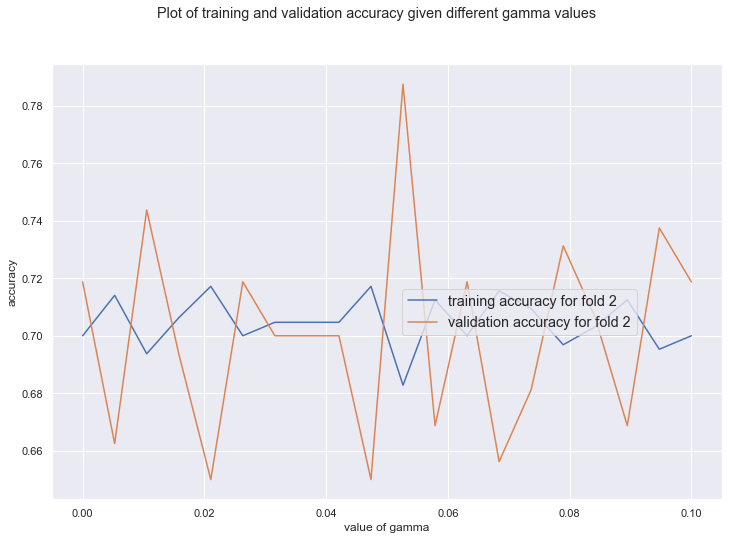

In [143]:
sns.set()

fig, ax = plt.subplots(figsize = (12,8))

ax.plot(gamma, train_2svm, label='training accuracy for fold 2')
ax.plot(gamma, val_2svm, label='validation accuracy for fold 2')

plt.xlabel('value of gamma')
plt.ylabel('accuracy')

plt.suptitle('Plot of training and validation accuracy given different gamma values')

fig.legend(loc='right', fontsize='large', bbox_to_anchor=(0.81,0.45), frameon=True)

plt.show()

In [144]:
val_svm = [val_1svm, val_2svm, val_3svm, val_4svm, val_5svm]
for i in range(5):
    j = np.argmax(val_svm[i])
    print("Best value of gamma for fold #{}: {}".format(i+1, gamma[j]))

Best value of gamma for fold #1: 0.07894736842105263
Best value of gamma for fold #2: 0.05263157894736842
Best value of gamma for fold #3: 0.04736842105263158
Best value of gamma for fold #4: 0.06842105263157895
Best value of gamma for fold #5: 0.005263157894736842


In [145]:
acc_mrbf1 = np.sum(val_svm, axis=0)/5
j = np.argmax(acc_mrbf1)
optimal_gamma = gamma[j]
print("Optimal gamma: {}".format(optimal_gamma))

Optimal gamma: 0.010526315789473684


In [154]:
b = np.linspace(1e-9, 1e-1, 20) # define range of parameter to tune

val_svm = [] # define empty matrix of validation set accuracy over all folds

val_1svm = [] # define empty matrix of validation set accuracy over fold #1
val_2svm = []
val_3svm = []
val_4svm = []
val_5svm = []

train_1svm = []#  define empty matrix of training set accuracy over fold #1
train_2svm = []
train_3svm = []
train_4svm = []
train_5svm = []
for i in range(len(b)): # loop over number of parameters gamma we are testing
    train_scores_svm, val_scores_svm = cross_val_evaluate_svm(bank_train, 5, optimal_gamma, b[i]) 
    val_1svm.append(val_scores_svm[0])
    val_2svm.append(val_scores_svm[1])
    val_3svm.append(val_scores_svm[2])
    val_4svm.append(val_scores_svm[3])
    val_5svm.append(val_scores_svm[4])
    train_1svm.append(train_scores_svm[0])
    train_2svm.append(train_scores_svm[1])
    train_3svm.append(train_scores_svm[2])
    train_4svm.append(train_scores_svm[3])
    train_5svm.append(train_scores_svm[4])

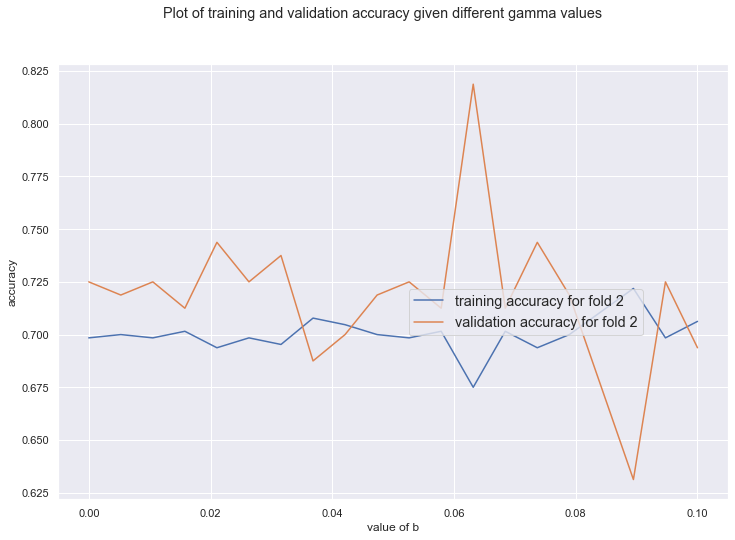

In [155]:
sns.set()

fig, ax = plt.subplots(figsize = (12,8))

ax.plot(b, train_2svm, label='training accuracy for fold 2')
ax.plot(b, val_2svm, label='validation accuracy for fold 2')

plt.xlabel('value of b')
plt.ylabel('accuracy')

plt.suptitle('Plot of training and validation accuracy given different gamma values')

fig.legend(loc='right', fontsize='large', bbox_to_anchor=(0.81,0.45), frameon=True)

plt.show()

In [156]:
val_svm = [val_1svm, val_2svm, val_3svm, val_4svm, val_5svm]
for i in range(5):
    j = np.argmax(val_svm[i])
    print("Best value of b for fold #{}: {}".format(i+1, b[j]))

Best value of b for fold #1: 0.015789474526315787
Best value of b for fold #2: 0.06315789510526315
Best value of b for fold #3: 0.07368421078947368
Best value of b for fold #4: 1e-09
Best value of b for fold #5: 0.042105263736842105


In [157]:
acc_mrbfb = np.sum(val_svm, axis=0)/5
j = np.argmax(acc_mrbfb)
optimal_b = b[j]
print("Optimal b: {}".format(optimal_b))

Optimal b: 0.010526316684210526


In [158]:
# run the model - grid search
n1 = 5
n2 = 5
N = n1*n2 # size of cross val validation data matrix of accuracy
val_1svmg = np.empty((3, N)) # define array of accuracies for fold 1
val_2svmg = np.empty((3, N))
val_3svmg = np.empty((3, N))
val_4svmg = np.empty((3, N))
val_5svmg = np.empty((3, N))
count = 0 # set count

for g in np.linspace(1e-5, 1e-1, n1):
    for bee in np.linspace(1e-6, 1e-1, n2):
        train_scores, val_scores_svmg = cross_val_evaluate_svm(bank_train, 5,  gamma=g, b=bee)
        val_1svmg[:,count] = [g, bee, val_scores_svmg[0]]
        val_2svmg[:,count] = [g, bee, val_scores_svmg[1]]
        val_3svmg[:,count] = [g, bee, val_scores_svmg[2]]
        val_4svmg[:,count] = [g, bee, val_scores_svmg[3]]
        val_5svmg[:,count] = [g, bee, val_scores_svmg[4]]
        count +=1
fold1_best = val_1svmg[:,np.argmax(val_1svmg[2, :])]
fold2_best = val_2svmg[:,np.argmax(val_2svmg[2, :])]
fold3_best = val_3svmg[:,np.argmax(val_3svmg[2, :])]
fold4_best = val_4svmg[:,np.argmax(val_4svmg[2, :])]
fold5_best = val_5svmg[:,np.argmax(val_5svmg[2, :])]
print(fold1_best)
print(fold2_best)
print(fold3_best)
print(fold4_best)
print(fold5_best)

[0.1  0.1  0.75]
[0.0750025 0.0500005 0.8      ]
[1.00000e-05 5.00005e-02 7.50000e-01]
[0.1        0.02500075 0.8       ]
[1.0000e-01 1.0000e-06 7.4375e-01]


In [159]:
# compute best parameters for our model with tuned gamma and b
acc_rbf = np.mean([val_1svmg[2,:], val_2svmg[2,:], val_3svmg[2,:], val_4svmg[2,:], val_5svmg[2,:]], axis=0)

bestparams_rbf = val_1svmg[[0,1], np.argmax(acc_rbf)]

print(bestparams_rbf)

[1.00000e-05 5.00005e-02]


Now, with our optimized parameters, let us compute the y_preds for our model

In [160]:
# redefine a function to output only the y_preds of our model
def score_rbf_bis(W, X, y, gamma, b):
    y_preds = np.array([])
    for i in range(X.shape[0]):
        y_pred = np.sign(rbf_k(X[i], W, gamma)+b)
        y_preds = np.append(y_preds, y_pred)
        #print('y predicted is', y_preds)
    return y_preds

In [161]:
# Compute the y_predicted
gamma = int(bestparams_rbf[0])
b = int(bestparams_rbf[1])
y_pred_rbf_train= score_rbf_bis(W, X_train, y_train, gamma, b)
y_pred_rbf_test= score_rbf_bis(W, X_test, y_test, gamma, b)

### Compute the F1 score

The F1 score is a function of precision and recall as defined in the random forest part:

$$
F1 = 2 * \frac{Precision * Recall}{Precision + Recall}
$$

with Precision = True Positive/ (True Positive + False Positive) and Recall = True Positive / (True Positive + False Negative) (5)

In [162]:
# confusion matrix for training data
import pandas as pd
data_train = {'y_Actual':  y_train  ,
        'y_Predicted': y_pred_rbf_train
        }

df_train = pd.DataFrame(data_train, columns=['y_Actual','y_Predicted'])

confusion_matrix_train = pd.crosstab(df_train['y_Actual'], df_train['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
print ('Confusion matrix for train data is:',confusion_matrix_train)

# confusion matrix for test data
data_test = {'y_Actual':  y_test  ,
        'y_Predicted': y_pred_rbf_test
        }

df_test = pd.DataFrame(data_test, columns=['y_Actual','y_Predicted'])

confusion_matrix_test = pd.crosstab(df_test['y_Actual'], df_test['y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
print ('Confusion matrix for test data is:', confusion_matrix_test)

Confusion matrix for train data is: Predicted  1.0
Actual        
-1.0       237
 1.0       563
Confusion matrix for test data is: Predicted  1.0
Actual        
-1.0        63
 1.0       137


In [163]:
# compute the F1 score with our optimized paramters on test data
TP= 137
FP= 63
TN= 0
FN= 0
precision = TP / (TP + FP)
recall = TP / (TP + FN) # also called the True Positive Rate or Sensitivity
FPR = FP / (FP + TN) # False Positive Rate or 1 - Specificity

F1= 2* (precision*recall)/(precision+recall)
print('The F1 score for our optimized gamma and b is:', F1)

The F1 score for our optimized gamma and b is: 0.8130563798219584


### Interpretation of F1 score

Our F1 score is relatively high, which generally is a good sign, however, we can see that our confusion matrix displays one 1's, hence our prediction vector for the response variable always classifies as 1. This is not good for the bank as they want to select people with the best criterion for granting credits. The error is probably in my code as I haven't implemented a dual svm.


## 2.3.2

In this task we are asked to evaluate the performance of our hard margin RBF kernel SVM on the test data using a receiver operating characteristic (also called ROC curve). However as we are predicting all ones, we are expecting our true positive rate and false positive rate to be equal no matter what.

Howver this is not what should have happened because it's very uncommon to be predicting all ones, there must be an error somewhere in my code chunks. Usually SVM with kernel should be our best classification method, but here its implementation was faulty and hence no good results are interpretable.


In [167]:
# code chunk from source 6 & 1
def roc(probabilities, partitions=100):
    roc = np.array([])
    for i in range(partitions + 1):
        threshold_vector = np.greater_equal(probabilities, i / partitions).astype(int)
        roc = np.append(roc, [FPR, recall])
    return roc.reshape(-1, 2)

Text(0, 0.5, 'True Positive Rate')

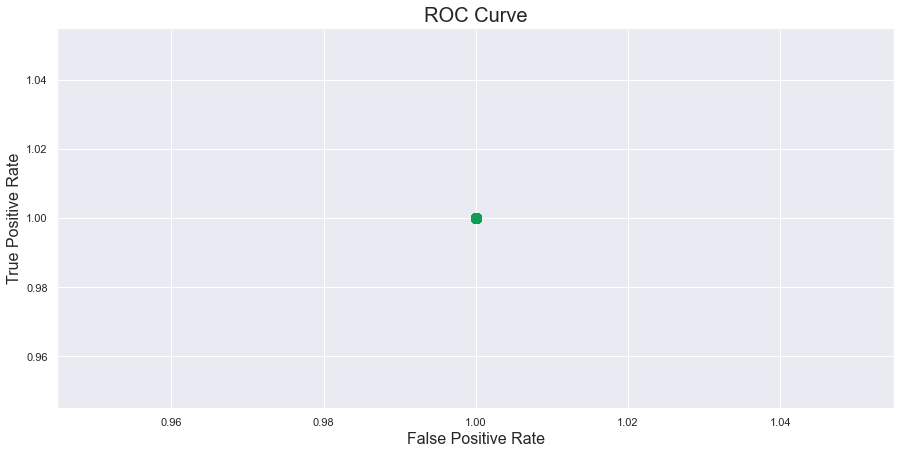

In [165]:
# code chunk from source 6
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set()
plt.figure(figsize=(15,7))

ROC = roc(y_pred_rbf_test, partitions=100)
plt.scatter(ROC[:,0],ROC[:,1],color='#0F9D58',s=100)
plt.title('ROC Curve',fontsize=20)
plt.xlabel('False Positive Rate',fontsize=16)
plt.ylabel('True Positive Rate',fontsize=16)

Overall the conclusion is that hard margin rbf kernel SVM and Random Forests should be performing quite well, however as my predicted response variables were bearing only ones, it is hard to make any conclusions from these results.

## References

In [ ]:
1. https://sefiks.com/2020/12/10/a-gentle-introduction-to-roc-curve-and-auc/
2. https://piazza.com/class/kg63tw8ab6mg9?cid=54
3. https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166
4. https://towardsdatascience.com/solving-svm-stochastic-gradient-descent-and-hinge-loss-8e8b4dd91f5b
5. https://towardsdatascience.com/accuracy-precision-recall-or-f1-331fb37c5cb9
6. https://towardsdatascience.com/roc-curve-and-auc-from-scratch-in-numpy-visualized-2612bb9459ab